In [ ]:
def sugeno_integral(values, fuzzy_measure):
    """
    Sugeno integral 계산 함수
    :param values: 각 요소의 값 (list of float)
    :param fuzzy_measure: 각 부분집합의 퍼지 측도 (dict)
    :return: Sugeno integral 값
    """
    n = len(values)
    sorted_indices = sorted(range(n), key=lambda i: values[i], reverse=True)
    sorted_values = [values[i] for i in sorted_indices]

    max_result = float('-inf')
    current_set = set()

    for i in range(n):
        current_set.add(sorted_indices[i])
        g = fuzzy_measure[frozenset(current_set)]
        min_val = min(sorted_values[i], g)
        max_result = max(max_result, min_val)

    return max_result


In [2]:
# 예시: 3개의 기준값
values = [0.7, 0.4, 0.9]

# 퍼지 측도 정의 (각 부분집합에 대한 측도)
fuzzy_measure = {
    frozenset(): 0.0,
    frozenset([0]): 0.3,
    frozenset([1]): 0.2,
    frozenset([2]): 0.5,
    frozenset([0, 1]): 0.4,
    frozenset([0, 2]): 0.7,
    frozenset([1, 2]): 0.6,
    frozenset([0, 1, 2]): 1.0
}

result = sugeno_integral(values, fuzzy_measure)
print("Sugeno Integral 결과:", result)


Sugeno Integral 결과: 0.7


In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SugenoSteeredMultiheadAttention(nn.Module):
    def __init__(self, embed_dim, num_heads):
        super().__init__()
        self.mha = nn.MultiheadAttention(embed_dim, num_heads, batch_first=True)
        self.num_heads = num_heads
        self.embed_dim = embed_dim
        self.head_dim = embed_dim // num_heads
        self.out_proj = nn.Linear(embed_dim, embed_dim)

    def forward(self, x):
        # x: [batch_size, seq_len, embed_dim]
        attn_output, _ = self.mha(x, x, x, need_weights=False)  # shape: [B, L, D]

        # Split into heads: [B, L, num_heads, head_dim]
        B, L, D = attn_output.shape
        head_outputs = attn_output.view(B, L, self.num_heads, self.head_dim)

        # Evaluate each head with simple norm-based function f(h_i)
        f_vals = torch.norm(head_outputs, dim=-1)  # [B, L, num_heads]

        # Normalize f_vals to [0, 1]
        f_vals = (f_vals - f_vals.min(dim=2, keepdim=True)[0]) / (f_vals.max(dim=2, keepdim=True)[0] - f_vals.min(dim=2, keepdim=True)[0] + 1e-6)

        # Define a simple fuzzy measure μ(S) as cardinality-based
        def fuzzy_measure(S):
            # S: list of head indices (set)
            # μ(S) = |S| / num_heads
            return len(S) / self.num_heads

        # Compute Sugeno integral per head
        sugeno_weights = torch.zeros(B, L, self.num_heads, device=x.device)
        for i in range(self.num_heads):
            for b in range(B):
                for l in range(L):
                    # For head i at batch b and token l
                    f_i = f_vals[b, l, i].item()
                    # Try all subsets S that contain head i
                    candidates = []
                    for j in range(self.num_heads):
                        if j == i:
                            S = {i}
                        else:
                            S = {i, j}
                        μ_S = fuzzy_measure(S)
                        candidates.append(min(f_i, μ_S))
                    sugeno_weights[b, l, i] = max(candidates)

        # Scale each head output
        head_outputs = head_outputs * sugeno_weights.unsqueeze(-1)  # [B, L, H, D_head]

        # Recombine
        attn_scaled = head_outputs.reshape(B, L, D)  # [B, L, D]
        output = self.out_proj(attn_scaled)  # [B, L, D]
        return output


In [31]:
import torch
from torch import nn

# 위에서 정의한 SugenoSteeredMultiheadAttention 클래스가 여기에 있다고 가정

# 하이퍼파라미터
batch_size = 1
seq_len = 4
embed_dim = 16
num_heads = 4

# 1️⃣ 테스트용 입력 데이터 생성
x = torch.randn(batch_size, seq_len, embed_dim)  # [B, L, D]

# 2️⃣ 모듈 초기화
steered_mha = SugenoSteeredMultiheadAttention(embed_dim=embed_dim, num_heads=num_heads)

# 3️⃣ 출력 계산
output = steered_mha(x)  # [B, L, D]

# 4️⃣ 결과 확인
print("✅ 입력 x shape:", x.shape)
print("✅ 출력 output shape:", output.shape)
print("🔎 출력 예시 (첫 배치, 첫 토큰):\n", output[0, 0])


✅ 입력 x shape: torch.Size([1, 4, 16])
✅ 출력 output shape: torch.Size([1, 4, 16])
🔎 출력 예시 (첫 배치, 첫 토큰):
 tensor([-0.2323,  0.0069, -0.1202,  0.2152,  0.0516, -0.0351, -0.1848,  0.0450,
        -0.1236,  0.1327,  0.1718,  0.1925,  0.0482, -0.2497,  0.1609, -0.0643],
       grad_fn=<SelectBackward0>)


In [32]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

torch.manual_seed(42)

# 테스트 입력: (batch_size=1, seq_len=3, embed_dim=8)
B, L, D = 1, 3, 8
H = 2  # num_heads
x = torch.randn(B, L, D)

print("입력 텐서 x:")
print(x)
print("shape:", x.shape)


입력 텐서 x:
tensor([[[ 1.9269,  1.4873,  0.9007, -2.1055,  0.6784, -1.2345, -0.0431,
          -1.6047],
         [ 0.3559, -0.6866, -0.4934,  0.2415, -1.1109,  0.0915, -2.3169,
          -0.2168],
         [-0.3097, -0.3957,  0.8034, -0.6216, -0.5920, -0.0631, -0.8286,
           0.3309]]])
shape: torch.Size([1, 3, 8])


In [33]:
mha = nn.MultiheadAttention(embed_dim=D, num_heads=H, batch_first=True)

# MHA 출력
attn_output,attn_weights = mha(x, x, x)  # [B, L, D]
print("MHA 출력:")
print(attn_output)
print("shape:", attn_output.shape)


MHA 출력:
tensor([[[ 0.2541, -0.0278, -0.2894, -0.2003, -0.2049, -0.4723,  0.0160,
          -0.2693],
         [ 0.8045, -0.5949, -0.0334, -0.0665, -0.6818, -0.0971, -0.1156,
          -0.6938],
         [ 0.3219, -0.0429, -0.1488, -0.1107, -0.1029, -0.2612, -0.0473,
          -0.2188]]], grad_fn=<TransposeBackward0>)
shape: torch.Size([1, 3, 8])


In [8]:
# Head dimension
D_head = D // H

# shape: [B, L, H, D_head]
head_outputs = attn_output.view(B, L, H, D_head)
print("head_outputs shape:", head_outputs.shape)

# 각 head별 출력을 보기 쉽게 출력
for h in range(H):
    print(f"\nHead {h} 출력:")
    print(head_outputs[0, :, h])  # [L, D_head]


head_outputs shape: torch.Size([1, 3, 2, 4])

Head 0 출력:
tensor([[ 0.2541, -0.0278, -0.2894, -0.2003],
        [ 0.8045, -0.5949, -0.0334, -0.0665],
        [ 0.3219, -0.0429, -0.1488, -0.1107]], grad_fn=<SelectBackward0>)

Head 1 출력:
tensor([[-0.2049, -0.4723,  0.0160, -0.2693],
        [-0.6818, -0.0971, -0.1156, -0.6938],
        [-0.1029, -0.2612, -0.0473, -0.2188]], grad_fn=<SelectBackward0>)


In [34]:
# 평가값: head output의 norm (token마다 head별로 계산)
f_vals = torch.norm(head_outputs, dim=-1)  # [B, L, H]
print("\n평가값 f(h_i) (norm 기준):")
print(f_vals)

# [0,1] 정규화 (head별로)
f_min = f_vals.amin(dim=(1, 2), keepdim=True)
f_max = f_vals.amax(dim=(1, 2), keepdim=True)

f_norm = (f_vals - f_min) / (f_max - f_min + 1e-6)

print("\n✅ [수정된] 정규화된 평가값 f_norm:")
print(f_norm)



평가값 f(h_i) (norm 기준):
tensor([[[0.4350, 0.5813],
         [1.0034, 0.9844],
         [0.3739, 0.3590]]], grad_fn=<LinalgVectorNormBackward0>)

✅ [수정된] 정규화된 평가값 f_norm:
tensor([[[0.1179, 0.3449],
         [1.0000, 0.9705],
         [0.0231, 0.0000]]], grad_fn=<DivBackward0>)


IndexError: Dimension out of range (expected to be in range of [-1, 0], but got 1)

In [29]:
# 아주 간단한 fuzzy measure 정의 (subset의 크기에 비례)
def fuzzy_measure(S, num_heads=H):
    return len(S) / num_heads

# Sugeno integral 계산
sugeno_weights = torch.zeros(B, L, H)

for b in range(B):
    for l in range(L):
        for i in range(H):
            f_i = f_norm[b, l, i].item()
            candidates = []
            for j in range(H):
                S = {i, j}
                mu = fuzzy_measure(S)
                candidates.append(min(f_i, mu))
            sugeno_weights[b, l, i] = max(candidates)

print("\nSugeno scaling weights x_i:")
print(sugeno_weights)



Sugeno scaling weights x_i:
tensor([[[0.0000, 1.0000],
         [0.9999, 0.0000],
         [0.9999, 0.0000]]])


In [30]:
# scaling 적용: [B, L, H, D_head]
scaled_heads = head_outputs * sugeno_weights.unsqueeze(-1)

# 다시 합치기: [B, L, D]
scaled_output = scaled_heads.reshape(B, L, D)
print("\n최종 scaled head output (concat 형태):")
print(scaled_output)



최종 scaled head output (concat 형태):
tensor([[[ 0.0000, -0.0000, -0.0000, -0.0000, -0.2049, -0.4723,  0.0160,
          -0.2693],
         [ 0.8045, -0.5949, -0.0334, -0.0665, -0.0000, -0.0000, -0.0000,
          -0.0000],
         [ 0.3219, -0.0429, -0.1488, -0.1107, -0.0000, -0.0000, -0.0000,
          -0.0000]]], grad_fn=<ViewBackward0>)


In [13]:
# projection layer (W^O 역할)
proj = nn.Linear(D, D)
final_output = proj(scaled_output)

print("\n최종 출력 (W^O 적용 후):")
print(final_output)



최종 출력 (W^O 적용 후):
tensor([[[-0.1160,  0.2897,  0.0772,  0.4852,  0.2628, -0.1684, -0.2593,
           0.2965],
         [-0.1580,  0.0887,  0.0931,  0.0523,  0.1425, -0.3425, -0.0395,
           0.0485],
         [-0.1021,  0.3046,  0.0669,  0.2279,  0.3080, -0.1637, -0.1235,
           0.2474]]], grad_fn=<ViewBackward0>)


In [37]:
import json

data = []
with open("/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5/res.json", "r", encoding="utf-8") as f:
    for line in f:
        line = line.strip()
        if line:  # 빈 줄 방지
            data.append(json.loads(line))



In [38]:
data[0].keys()

dict_keys(['dataset', 'model', 'option', 'method', 'weight', 'layer', 'head', 'Individual accuracy', 'Pair accuracy', 'Set accuracy', 'correct_id'])

In [83]:
from collections import defaultdict

base_acc = 60 
total_head =1024
importances = defaultdict(dict)

for sample in data:
    if sample['method'] == 'scaling_vis':
        layer = sample['layer']
        head = sample['head']
        x = max(0,base_acc - sample['Individual accuracy'])
        importances[layer][head] = x 

In [84]:
Z = max(
    abs(x)
    for layer_heads in importances.values()
    for x in layer_heads.values()
)

In [85]:
importances_normalized = defaultdict(dict)

for layer, heads in importances.items():
    for head, x in heads.items():
        x_norm = x / Z if Z != 0 else 0  # 혹시 몰라서 0 division 방지
        importances_normalized[layer][head] = x_norm

importances_normalized_sort = dict(sorted(importances_normalized.items(), key=lambda item: item[0]))

In [86]:
importances_normalized_sort

{0: {0: 0.0,
  1: 0.15625000000000006,
  2: 0.09374999999999975,
  3: 0.0,
  4: 0.0,
  5: 0.0,
  6: 0.0,
  7: 0.0,
  8: 0.09374999999999975,
  9: 0.0,
  10: 0.0,
  11: 0.0,
  12: 0.0,
  13: 0.0,
  14: 0.0,
  15: 0.0,
  16: 0.0,
  17: 0.0,
  18: 0.0,
  19: 0.0,
  20: 0.03125000000000016,
  21: 0.0,
  22: 0.0,
  23: 0.0,
  24: 0.0,
  25: 0.06249999999999959,
  26: 0.0,
  27: 0.0,
  28: 0.0,
  29: 0.0,
  30: 0.0,
  31: 0.0},
 1: {0: 0.06249999999999959,
  1: 0.8124999999999998,
  2: 0.0,
  3: 0.0,
  4: 0.03125000000000016,
  5: 0.0,
  6: 0.0,
  7: 0.0,
  8: 0.0,
  9: 0.0,
  10: 0.0,
  11: 0.0,
  12: 0.09374999999999975,
  13: 0.0,
  14: 0.0,
  15: 0.1249999999999999,
  16: 0.03125000000000016,
  17: 0.0,
  18: 0.0,
  19: 0.0,
  20: 0.06249999999999959,
  21: 0.0,
  22: 0.2187500000000004,
  23: 0.1249999999999999,
  24: 0.03125000000000016,
  25: 0.0,
  26: 0.2187500000000004,
  27: 0.0,
  28: 0.03125000000000016,
  29: 0.0,
  30: 0.03125000000000016,
  31: 0.0},
 2: {0: 0.187500000000000

In [96]:
from collections import defaultdict

base_acc = 60 
total_head = 1024
layer_heads = defaultdict(list)  # dict → list 로 수정

for sample in data:
    if sample['method'] == 'scaling_vis':
        layer = sample['layer']
        head = sample['head']
        x =  base_acc - sample['Individual accuracy']

        print(x)

        
        if x < 0:
            layer_heads[layer].append(head)


0.30303030303030454
-0.30303030303030454
0.30303030303030454
2.7272727272727266
0.606060606060602
0.30303030303030454
1.5151515151515156
0.9090909090909065
-2.424242424242429
-1.818181818181813
0.9090909090909065
1.5151515151515156
-5.454545454545453
-3.9393939393939377
-2.424242424242429
1.5151515151515156
-3.636363636363633
0.0
-2.1212121212121247
-0.30303030303030454
-0.6060606060606091
0.0
-2.424242424242429
-0.30303030303030454
7.575757575757571
0.0
0.606060606060602
0.9090909090909065
-2.7272727272727337
0.0
0.0
-0.9090909090909136
2.424242424242422
0.9090909090909065
0.606060606060602
7.878787878787875
-10.0
-0.30303030303030454
0.0
1.8181818181818201
-0.30303030303030454
-2.424242424242429
-0.30303030303030454
-5.151515151515156
0.0
0.0
-0.6060606060606091
-8.181818181818173
-0.30303030303030454
-1.818181818181813
0.30303030303030454
-1.818181818181813
0.0
-1.5151515151515085
-1.5151515151515085
-5.454545454545453
0.30303030303030454
0.0
-0.6060606060606091
4.242424242424235
0.

In [99]:
print(layer_heads)

defaultdict(<class 'list'>, {0: [0, 3, 4, 9, 10, 12, 13, 15, 16, 19, 21, 22, 29, 31], 8: [2, 3, 4, 5, 7, 11, 12, 13, 14, 19, 20, 21, 23, 25, 26, 27, 28, 29, 30], 22: [2, 3, 5, 8, 9, 10, 12, 17, 20, 23, 26, 28, 31], 16: [4, 5, 9, 10, 12, 13, 14, 18, 20, 22, 24, 28, 30], 23: [0, 1, 2, 5, 10, 11, 12, 14, 15, 19, 21, 22, 24, 28], 9: [0, 1, 3, 5, 9, 10, 11, 12, 13, 14, 16, 17, 20, 22, 23, 24, 25, 29, 30, 31], 1: [2, 3, 5, 6, 7, 8, 9, 10, 11, 13, 17, 18, 19, 21, 25, 27, 29], 17: [0, 1, 2, 4, 6, 7, 8, 10, 11, 16, 17, 18, 19, 20, 21, 23, 25, 26, 27, 29, 30], 24: [0, 2, 6, 8, 9, 10, 13, 15, 16, 17, 20, 22, 26, 27, 28], 10: [1, 2, 4, 8, 10, 11, 12, 14, 15, 18, 19, 20, 21, 22, 23, 27, 30], 2: [3, 6, 10, 13, 16, 19, 20, 21, 22, 24, 28, 29, 30], 18: [2, 4, 6, 7, 8, 11, 12, 14, 16, 17, 18, 19, 21, 22, 24, 27, 28, 31], 25: [0, 7, 8, 12, 17, 20, 21, 22, 25, 26, 27, 30], 11: [0, 1, 3, 5, 6, 9, 11, 12, 13, 19, 20, 21, 22, 25, 28, 29, 30, 31], 3: [1, 3, 8, 9, 12, 14, 16, 17, 22, 28], 19: [1, 2, 4, 6, 9, 

In [1]:
import os
import json
import pandas as pd
from collections import defaultdict
from tqdm import tqdm 

# 경로 설정
base_path = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5_scalingfactor"
file_pattern = "results1.5_scaling_factor_head_layer{}.json"

# 누적할 자료구조: (layer, head, method, token_idx) → list of scores
scores = defaultdict(list)

# 파일 반복
for layer in tqdm(range(32)):
    file_path = os.path.join(base_path, file_pattern.format(layer))
    
    with open(file_path, "r", encoding="utf-8") as f:
        for line in f:
            obj = json.loads(line)
            layer_idx = obj["layer_idx"]
            heads = obj["x_all_methods"]

            for head_str, method_dict in heads.items():
                head = int(head_str)
                for method, values in method_dict.items():
                    for token_idx, score in enumerate(values):
                        key = (layer_idx, head, method, token_idx)
                        scores[key].append(score)

# 평균 계산 후 구조화
records = []
for (layer, head, method, token_idx), value_list in scores.items():
    avg_score = sum(value_list) / len(value_list)
    records.append({
        "layer": layer,
        "head": head,
        "method": method,
        "token_idx": token_idx,
        "importance_avg": avg_score
    })

# DataFrame 생성
df_avg_token_importance = pd.DataFrame(records)


100%|██████████| 32/32 [33:45<00:00, 63.31s/it]


In [23]:
df_avg_token_importance

,layer,head,method,token_idx,importance_avg
0,0,0,mean,0,-0.377552
1,0,0,mean,1,-0.587402
2,0,0,mean,2,-0.765588
3,0,0,mean,3,-0.818408
4,0,0,mean,4,-0.680441
...,...,...,...,...,...
2674683,31,30,variance,652,0.000000
2674684,31,31,mean,652,-0.785908
2674685,31,31,1-entropy,652,NaN
2674686,31,31,max,652,-0.785908


In [24]:
import pandas as pd

result = {}

for method, group in df_avg_token_importance.groupby("method"):
    # token_idx 기준 정렬
    group_sorted = group.sort_values("token_idx")
    
    # importance_avg를 리스트로 변환
    result[method] = group_sorted["importance_avg"].tolist()


In [22]:
result.keys()

dict_keys(['1-entropy', 'max', 'mean', 'variance'])

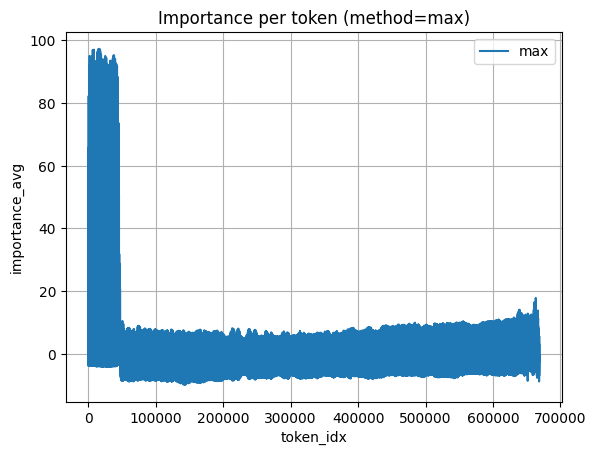

In [31]:
import matplotlib.pyplot as plt

# 예시: result['max'] 가 리스트라고 가정
# result = {'max': [...], 'mean': [...], 'min': [...]}

plt.plot(result['max'], label='max')  # 선그래프
plt.xlabel("token_idx")   # x축 = token index
plt.ylabel("importance_avg")  # y축 = importance 값
plt.title("Importance per token (method=max)")   # 그래프 제목
plt.legend()
plt.grid(True)
plt.show()


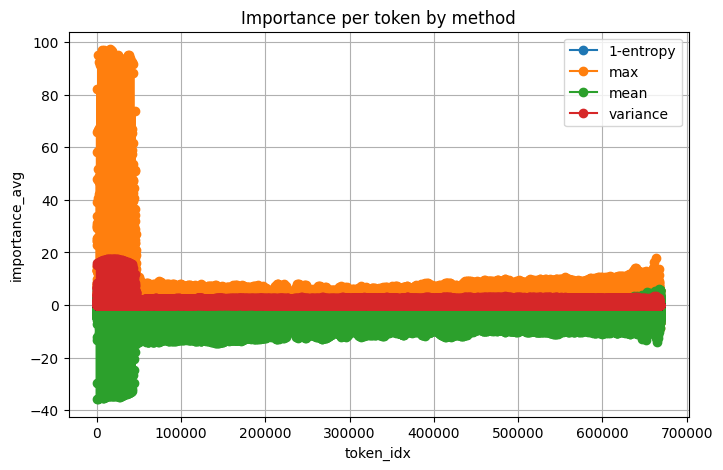

In [32]:
plt.figure(figsize=(8,5))

for method, values in result.items():
    plt.plot(values, marker='o', label=method)

plt.xlabel("token_idx")
plt.ylabel("importance_avg")
plt.title("Importance per token by method")
plt.legend()
plt.grid(True)
plt.show()


In [35]:
import json
import pandas as pd

# res.json 읽기
res_path = '/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5/res.json'

results = []
with open(res_path, "r", encoding="utf-8") as f:
    for line in f:
        results.append(json.loads(line))

res_df = pd.DataFrame(results)

# ✅ method == 'scaling_vis' 만 선택
res_df = res_df[res_df["method"] == "scaling_vis"]

# 레이어별 평균 정확도 집계
layer_acc = (
    res_df.groupby("layer")[["Individual accuracy", "Pair accuracy", "Set accuracy"]]
    .mean()
)

print(layer_acc.head())


       Individual accuracy  Pair accuracy  Set accuracy
layer                                                  
0                60.965909      40.454545      0.000000
1                60.435606      39.886364      0.000000
2                59.460227      40.303030      0.075758
3                58.153409      39.393939      0.227273
4                60.880682      39.905303      0.000000


In [37]:
# method별 importance (layer × method)
layer_method = (
    df_avg_token_importance.groupby(["layer", "method"])["importance_avg"]
      .mean()
      .unstack()
)

# 정확도 붙이기
merged = layer_method.join(layer_acc)

# Individual accuracy 기준으로 method별 상관관계
correlations = (
    merged.corr()["Individual accuracy"]
    .drop(["Individual accuracy", "Pair accuracy", "Set accuracy"])
    .sort_values(ascending=False)
)

print(correlations)


max          0.298875
mean         0.272209
variance    -0.273929
1-entropy         NaN
Name: Individual accuracy, dtype: float64


In [40]:
import json

file_path = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5_attention_entropy_head/correct_attention_entropy.json"

data = []
with open(file_path, "r", encoding="utf-8") as f:
    for line in f:
        if line.strip():  # 빈 줄 무시
            data.append(json.loads(line))

print(len(data))   # 몇 개 레이어 결과가 있는지 확인


320


In [43]:
data[31]

{'layer': 31,
 'heads': [{'head': 0,
   'entropy_img': 0.0007231591735035181,
   'entropy_non_img': 0.006927113980054855},
  {'head': 1,
   'entropy_img': 0.0008457429357804358,
   'entropy_non_img': 0.0067712487652897835},
  {'head': 2,
   'entropy_img': 0.0009442701120860875,
   'entropy_non_img': 0.005434530321508646},
  {'head': 3,
   'entropy_img': 0.0008758449112065136,
   'entropy_non_img': 0.006321548949927092},
  {'head': 4,
   'entropy_img': 0.0006305182469077408,
   'entropy_non_img': 0.006647894624620676},
  {'head': 5,
   'entropy_img': 0.0014200374716892838,
   'entropy_non_img': 0.005662926938384771},
  {'head': 6,
   'entropy_img': 0.0028200813103467226,
   'entropy_non_img': 0.006499182432889938},
  {'head': 7,
   'entropy_img': 0.0008521539275534451,
   'entropy_non_img': 0.00577574921771884},
  {'head': 8,
   'entropy_img': 0.0007814370910637081,
   'entropy_non_img': 0.006372778210788965},
  {'head': 9,
   'entropy_img': 0.0011105980956926942,
   'entropy_non_img': 

In [44]:
layers_per_sample = 32   # 한 샘플당 32개 레이어
for i, entry in enumerate(data):
    sample_id = i // layers_per_sample
    entry["sample_id"] = sample_id

# 확인
print(data[0]["layer"], data[0]["sample_id"])   # layer=0, sample_id=0
print(data[31]["layer"], data[31]["sample_id"]) # layer=31, sample_id=0
print(data[32]["layer"], data[32]["sample_id"]) # layer=0, sample_id=1

0 0
31 0
0 1


In [47]:
data[0]

{'layer': 0,
 'heads': [{'head': 0,
   'entropy_img': 0.00019743650045711547,
   'entropy_non_img': 0.008718998171389103},
  {'head': 1,
   'entropy_img': 0.008090143091976643,
   'entropy_non_img': 0.009380885399878025},
  {'head': 2,
   'entropy_img': 0.009397665970027447,
   'entropy_non_img': 0.009330143220722675},
  {'head': 3,
   'entropy_img': 0.005161173641681671,
   'entropy_non_img': 0.008383562788367271},
  {'head': 4,
   'entropy_img': 0.004812052473425865,
   'entropy_non_img': 0.007439519744366407},
  {'head': 5,
   'entropy_img': 0.008965683169662952,
   'entropy_non_img': 0.009383097290992737},
  {'head': 6,
   'entropy_img': 0.008159516379237175,
   'entropy_non_img': 0.009145290590822697},
  {'head': 7,
   'entropy_img': 0.003585947910323739,
   'entropy_non_img': 0.005582547280937433},
  {'head': 8,
   'entropy_img': 0.0005915903020650148,
   'entropy_non_img': 0.009220191277563572},
  {'head': 9,
   'entropy_img': 0.008435423485934734,
   'entropy_non_img': 0.008100

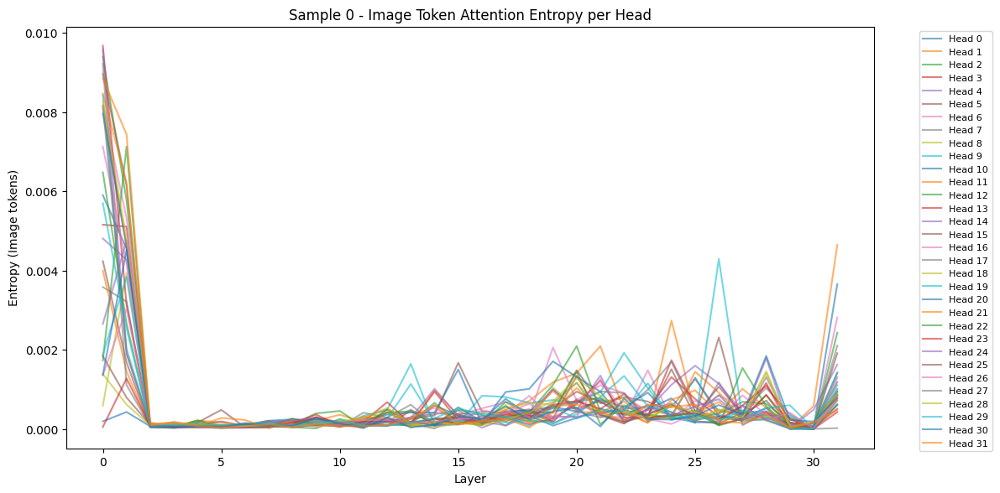

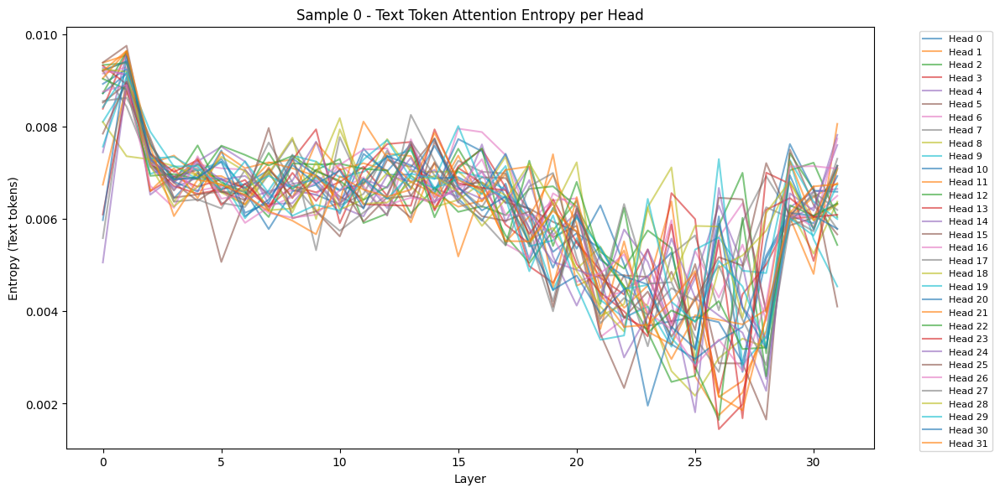

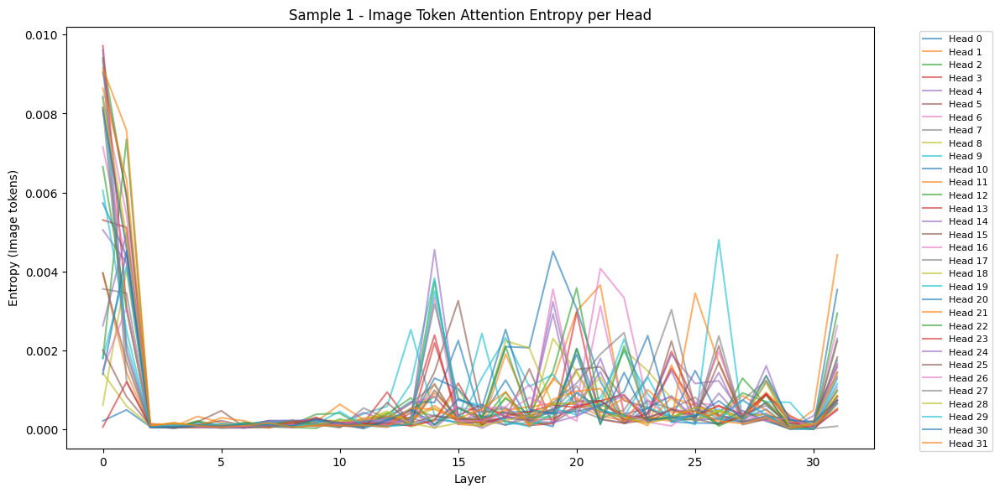

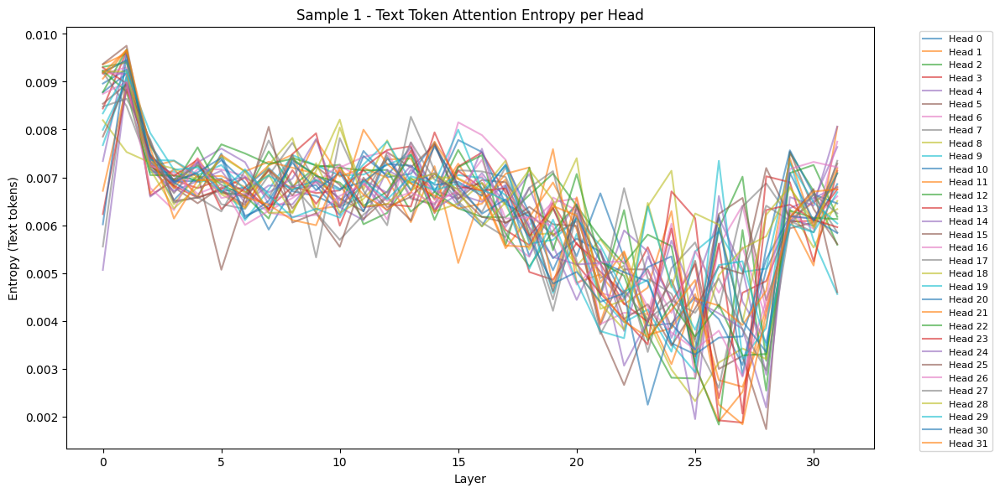

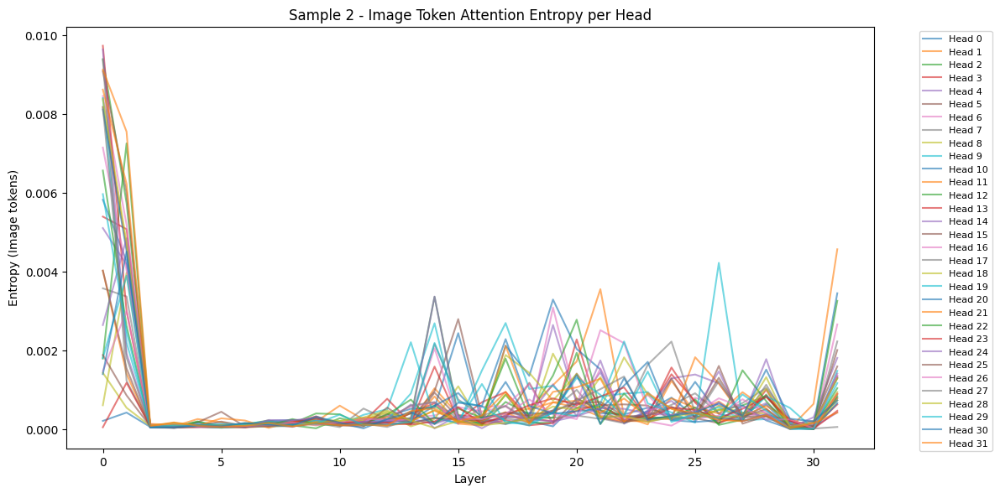

...

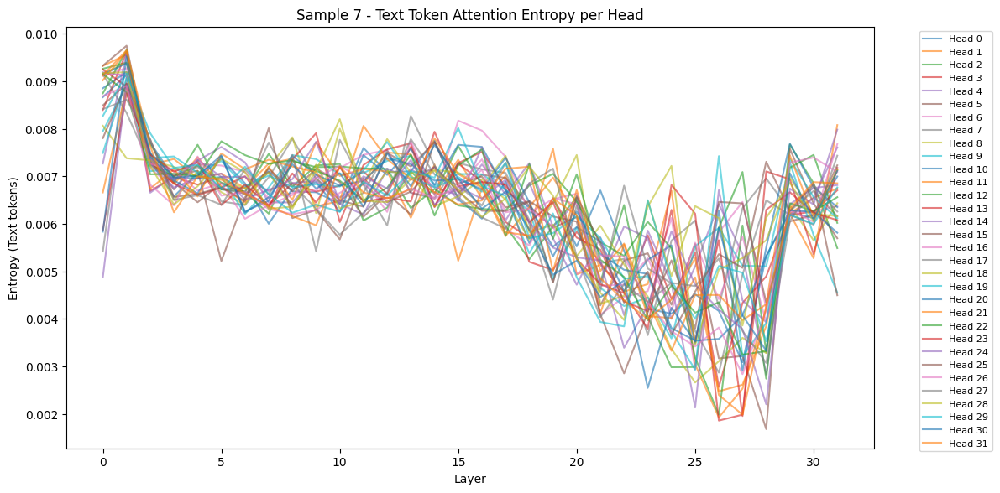

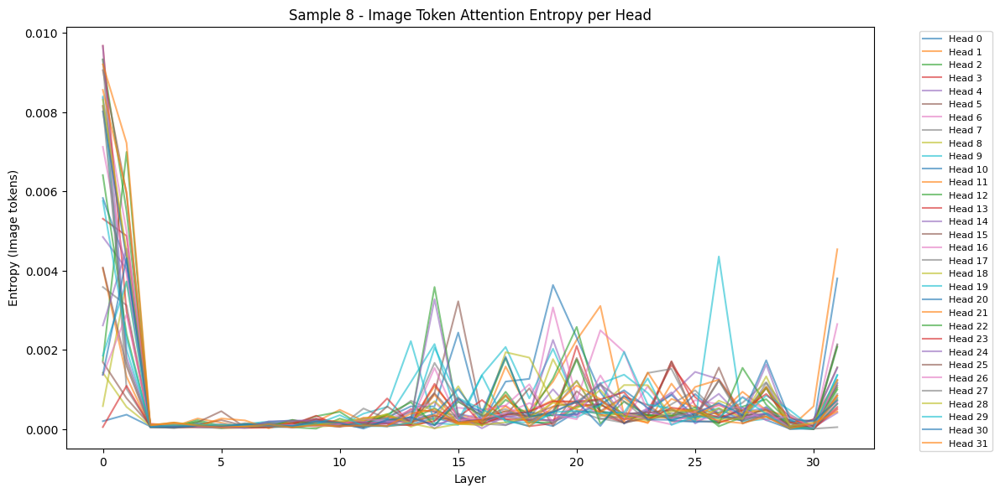

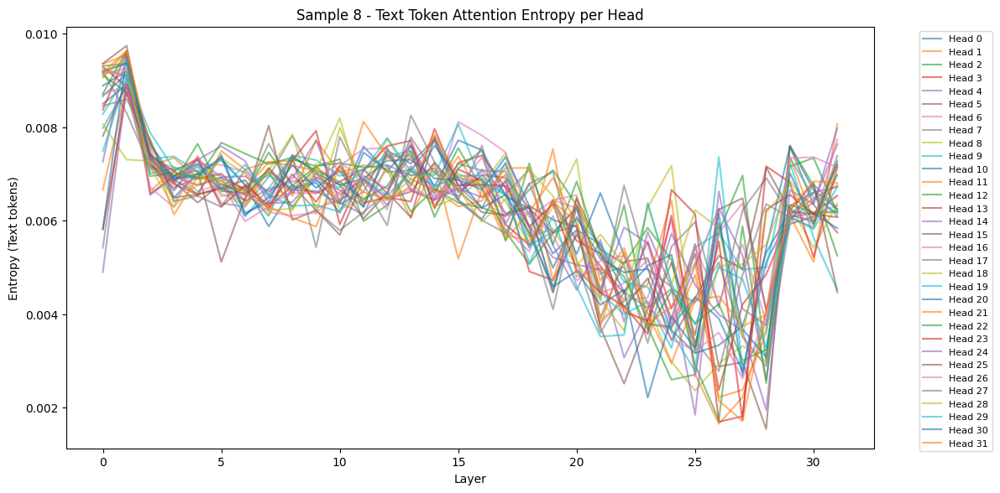

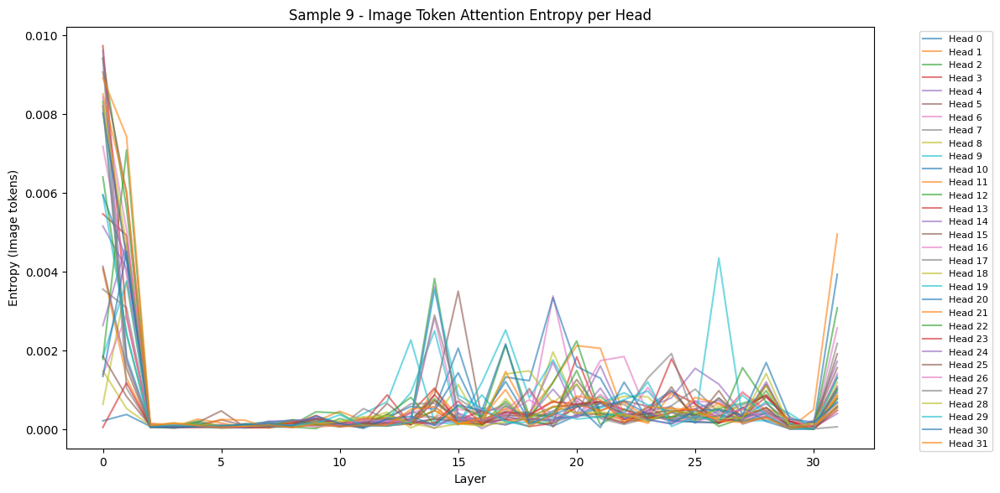

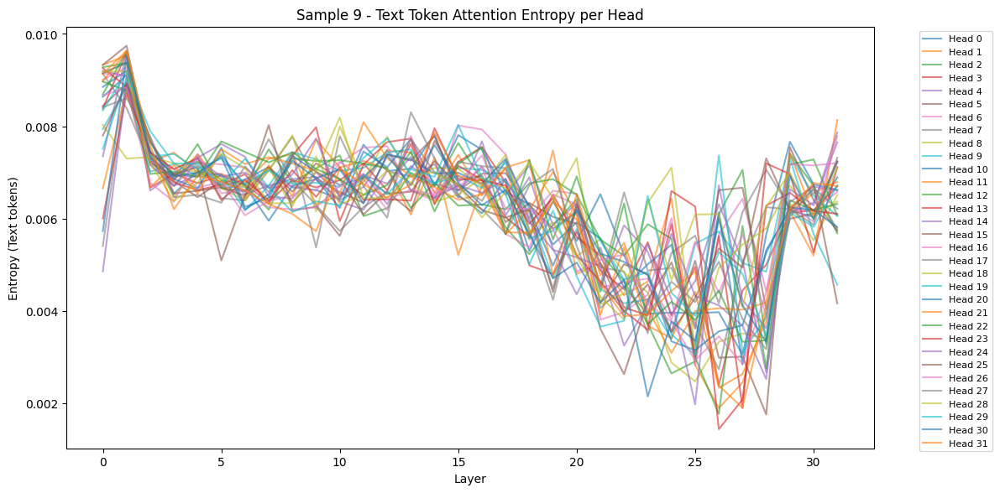

In [48]:
import matplotlib.pyplot as plt
import pandas as pd

# DataFrame 변환
records = []
for entry in data:
    layer = entry["layer"]
    sample_id = entry["sample_id"]
    for h in entry["heads"]:
        records.append({
            "sample_id": sample_id,
            "layer": layer,
            "head": h["head"],
            "entropy_img": h["entropy_img"],
            "entropy_non_img": h["entropy_non_img"]
        })

df = pd.DataFrame(records)

# 샘플별 시각화
for sid in df["sample_id"].unique():
    df_sample = df[df["sample_id"] == sid]

    # 이미지 토큰 엔트로피
    plt.figure(figsize=(12, 6))
    for head in df_sample["head"].unique():
        df_head = df_sample[df_sample["head"] == head]
        plt.plot(df_head["layer"], df_head["entropy_img"], alpha=0.6, label=f"Head {head}")
    plt.title(f"Sample {sid} - Image Token Attention Entropy per Head")
    plt.xlabel("Layer")
    plt.ylabel("Entropy (Image tokens)")
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=8)
    plt.tight_layout()
    plt.show()

    # 텍스트 토큰 엔트로피
    plt.figure(figsize=(12, 6))
    for head in df_sample["head"].unique():
        df_head = df_sample[df_sample["head"] == head]
        plt.plot(df_head["layer"], df_head["entropy_non_img"], alpha=0.6, label=f"Head {head}")
    plt.title(f"Sample {sid} - Text Token Attention Entropy per Head")
    plt.xlabel("Layer")
    plt.ylabel("Entropy (Text tokens)")
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=8)
    plt.tight_layout()
    plt.show()


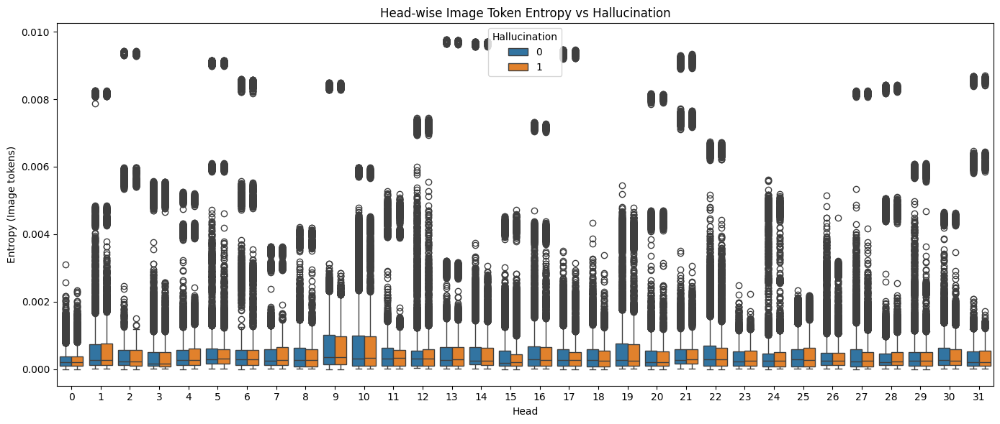

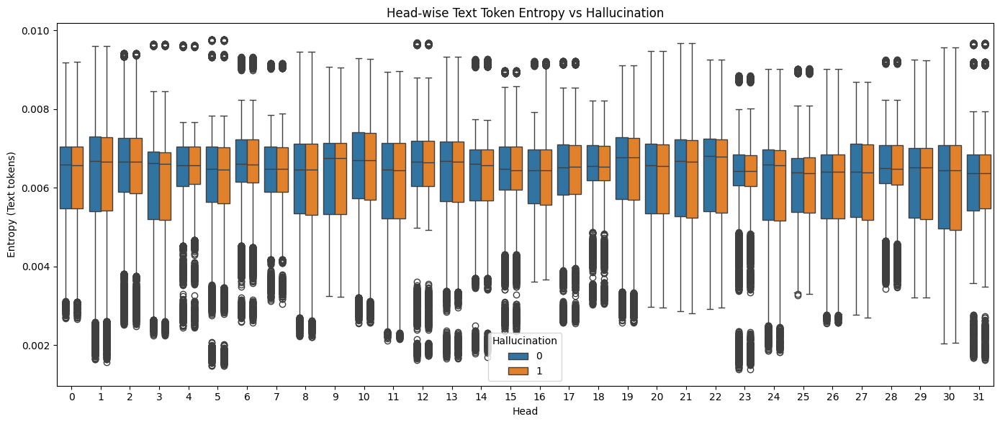

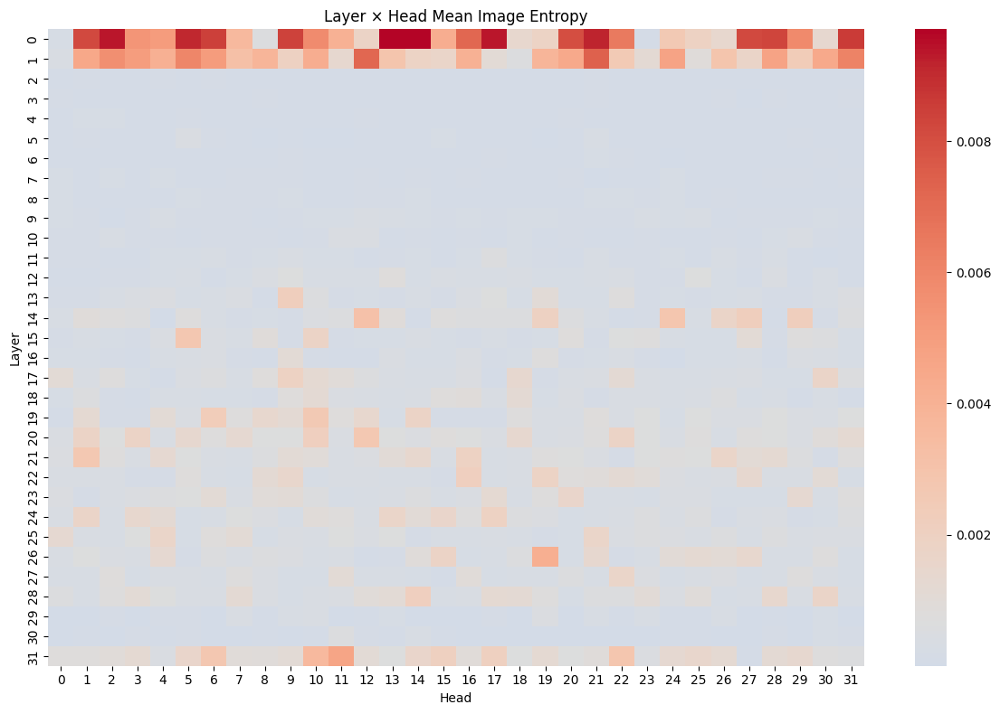

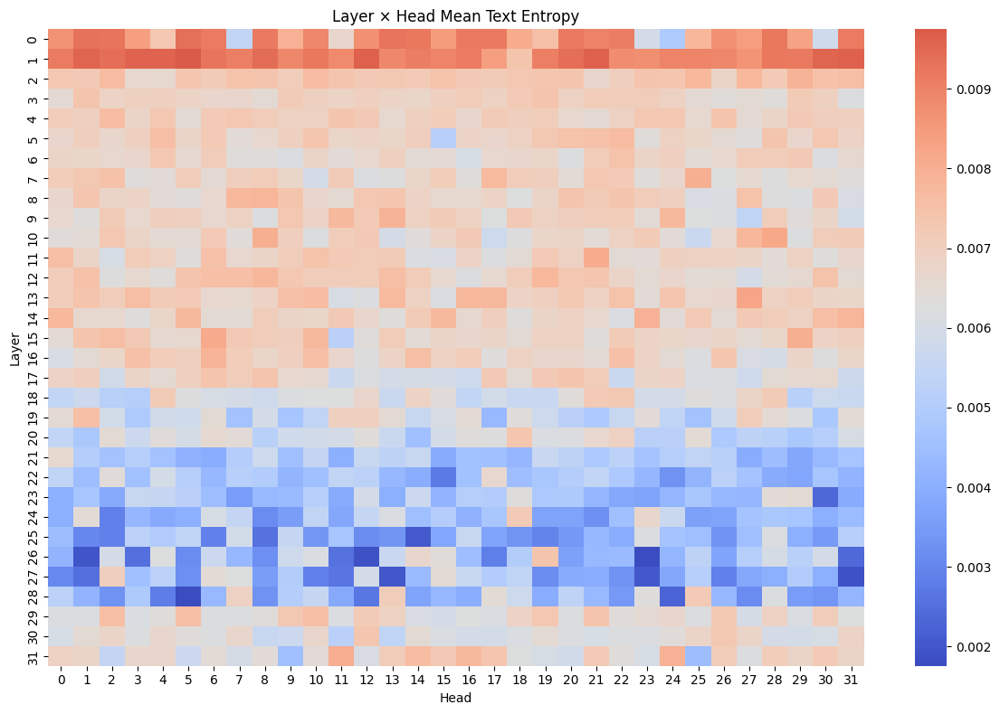

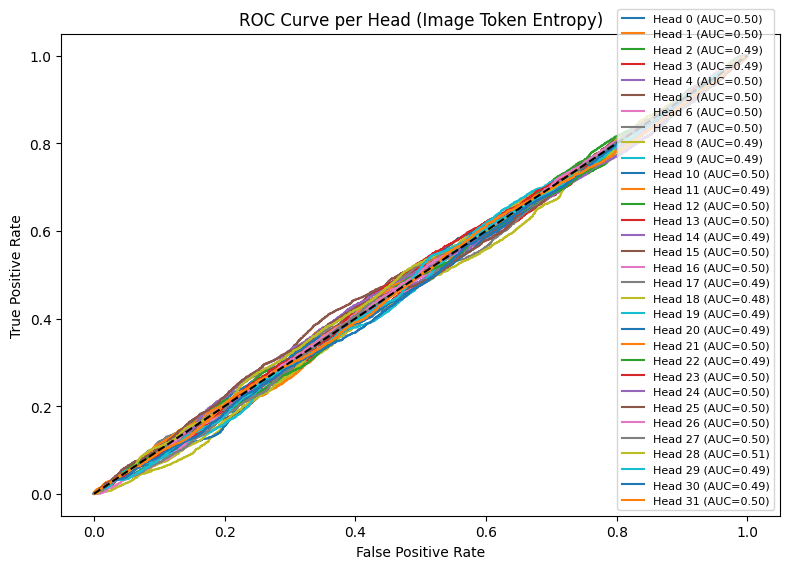

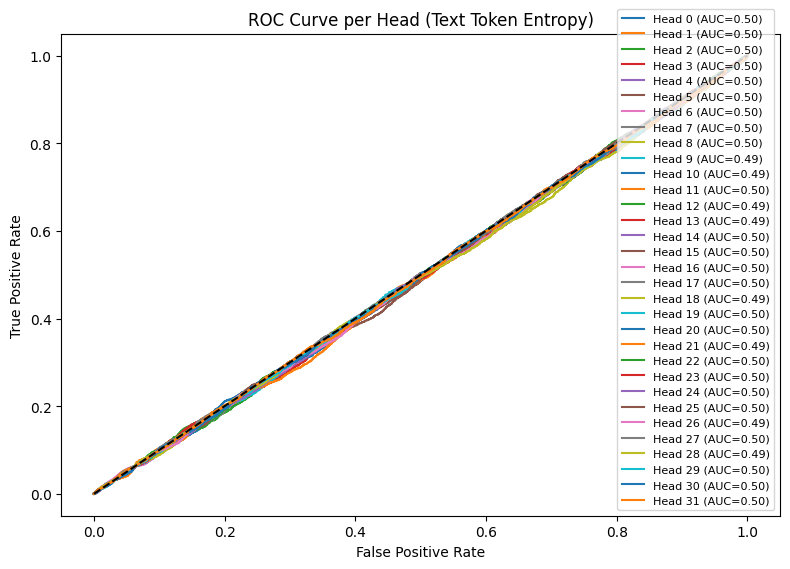

In [68]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, auc

# ======================
# 1. Entropy 데이터 불러오기
# ======================
entropy_file = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5_attention_entropy_head/correct_attention_entropy.json"

data = []
with open(entropy_file, "r", encoding="utf-8") as f:
    for line in f:
        if line.strip():
            data.append(json.loads(line))

# 샘플 id 부여 (레이어 32개가 한 샘플)
layers_per_sample = 32
for i, entry in enumerate(data):
    sample_id = i // layers_per_sample
    entry["sample_id"] = sample_id

# DataFrame 변환
records = []
for entry in data:
    layer = entry["layer"]
    sample_id = entry["sample_id"]
    for h in entry["heads"]:
        records.append({
            "sample_id": sample_id,
            "layer": layer,
            "head": h["head"],
            "entropy_img": h["entropy_img"],
            "entropy_non_img": h["entropy_non_img"]
        })

df = pd.DataFrame(records)

# ======================
# 2. 할루시네이션 라벨 불러오기
# ======================
result_file = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/results1.5_Controlled_Images_A_fuzzy_measure_0.01_fouroption_True_layer0_head0.json"

with open(result_file, "r", encoding="utf-8") as f:
    results = json.load(f)

# 샘플별 hallucination 여부 생성
hallucination_labels = {}
for idx, sample in enumerate(results):
    hallucination_labels[idx] = 0 if sample["Generation"].strip() == sample["Golden"].strip() else 1

# df에 라벨 붙이기
df["hallucination"] = df["sample_id"].map(hallucination_labels)

# ======================
# 3. Boxplot: Head별 entropy 분포 (hallucination vs 정상)
# ======================
plt.figure(figsize=(14, 6))
sns.boxplot(data=df, x="head", y="entropy_img", hue="hallucination")
plt.title("Head-wise Image Token Entropy vs Hallucination")
plt.xlabel("Head")
plt.ylabel("Entropy (Image tokens)")
plt.legend(title="Hallucination")
plt.tight_layout()
plt.show()

plt.figure(figsize=(14, 6))
sns.boxplot(data=df, x="head", y="entropy_non_img", hue="hallucination")
plt.title("Head-wise Text Token Entropy vs Hallucination")
plt.xlabel("Head")
plt.ylabel("Entropy (Text tokens)")
plt.legend(title="Hallucination")
plt.tight_layout()
plt.show()

# ======================
# 4. Heatmap: Layer × Head 평균 entropy (hallucination vs non)
# ======================
heatmap_data = (
    df.groupby(["layer", "head", "hallucination"])["entropy_img"]
      .mean()
      .reset_index()
      .pivot_table(index="layer", columns="head", values="entropy_img", aggfunc="mean")
)

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap="coolwarm", center=heatmap_data.values.mean())
plt.title("Layer × Head Mean Image Entropy")
plt.xlabel("Head")
plt.ylabel("Layer")
plt.tight_layout()
plt.show()


heatmap_data = (
    df.groupby(["layer", "head", "hallucination"])["entropy_non_img"]
      .mean()
      .reset_index()
      .pivot_table(index="layer", columns="head", values="entropy_non_img", aggfunc="mean")
)

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap="coolwarm", center=heatmap_data.values.mean())
plt.title("Layer × Head Mean Text Entropy")
plt.xlabel("Head")
plt.ylabel("Layer")
plt.tight_layout()
plt.show()


# ======================
# 5. ROC Curve: Head별 탐지 성능
# ======================
plt.figure(figsize=(8, 6))

for head_id in df["head"].unique():
    head_vals = df[df["head"] == head_id]
    y_true = head_vals["hallucination"].values
    y_score = head_vals["entropy_img"].values

    if len(set(y_true)) < 2:  # 라벨이 한쪽만 있으면 ROC 불가
        continue

    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"Head {head_id} (AUC={roc_auc:.2f})")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve per Head (Image Token Entropy)")
plt.legend(loc="lower right", fontsize=8)
plt.tight_layout()
plt.show()



plt.figure(figsize=(8, 6))

for head_id in df["head"].unique():
    head_vals = df[df["head"] == head_id]
    y_true = head_vals["hallucination"].values
    y_score = head_vals["entropy_non_img"].values

    if len(set(y_true)) < 2:  # 라벨이 한쪽만 있으면 ROC 불가
        continue

    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"Head {head_id} (AUC={roc_auc:.2f})")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve per Head (Text Token Entropy)")
plt.legend(loc="lower right", fontsize=8)
plt.tight_layout()
plt.show()

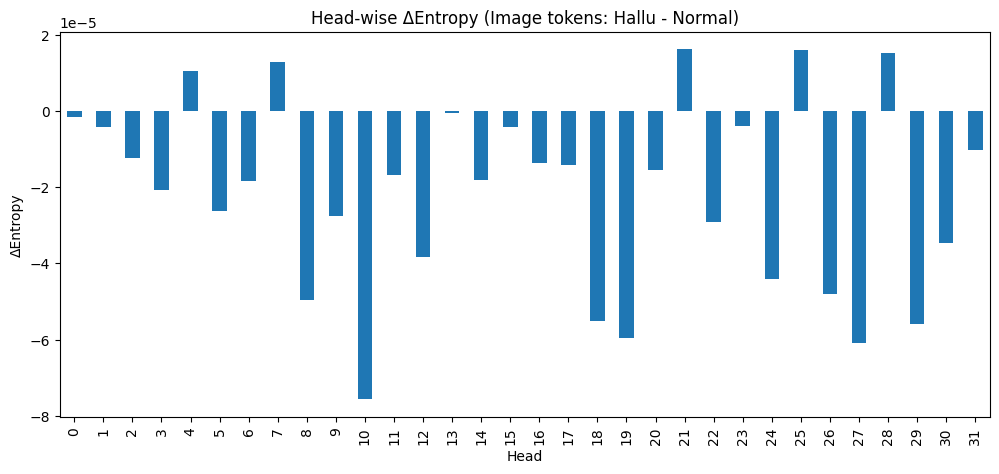

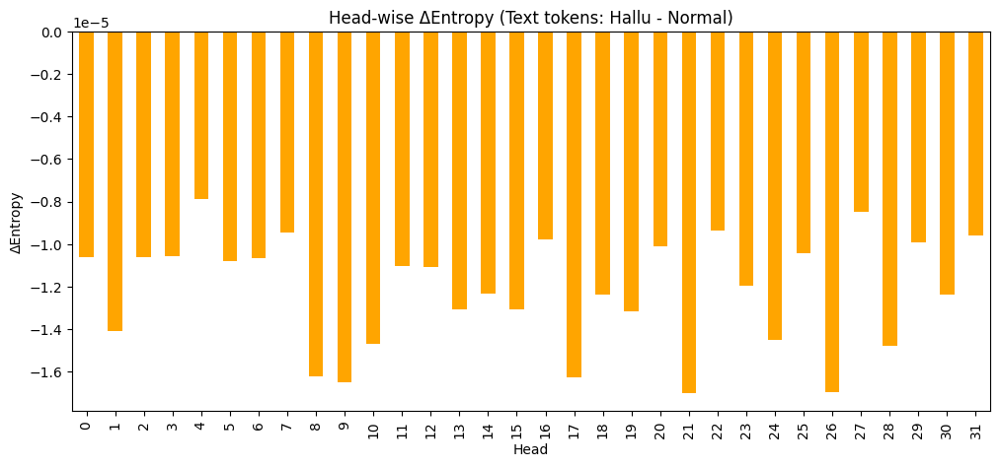

In [74]:
# Head별 평균 차이
mean_vals = df.groupby(["head", "hallucination"])[["entropy_img", "entropy_non_img"]].mean().reset_index()

delta_img = mean_vals.pivot(index="head", columns="hallucination", values="entropy_img")
delta_img["delta"] = delta_img[1] - delta_img[0]  # hallucination - normal

plt.figure(figsize=(12, 5))
delta_img["delta"].plot(kind="bar")
plt.title("Head-wise ΔEntropy (Image tokens: Hallu - Normal)")
plt.xlabel("Head")
plt.ylabel("ΔEntropy")
plt.show()

delta_non = mean_vals.pivot(index="head", columns="hallucination", values="entropy_non_img")
delta_non["delta"] = delta_non[1] - delta_non[0]

plt.figure(figsize=(12, 5))
delta_non["delta"].plot(kind="bar", color="orange")
plt.title("Head-wise ΔEntropy (Text tokens: Hallu - Normal)")
plt.xlabel("Head")
plt.ylabel("ΔEntropy")
plt.show()


In [70]:
from scipy.stats import spearmanr

# AUC per head 계산
auc_scores = {}
for head_id in df["head"].unique():
    head_vals = df[df["head"] == head_id]
    y_true = head_vals["hallucination"].values
    y_score = head_vals["entropy_img"].values
    if len(set(y_true)) < 2:
        continue
    fpr, tpr, _ = roc_curve(y_true, y_score)
    auc_scores[head_id] = auc(fpr, tpr)

# head별 평균 entropy
entropy_means = df.groupby("head")["entropy_img"].mean()

# Spearman correlation
common_heads = set(entropy_means.index) & set(auc_scores.keys())
rho, pval = spearmanr([entropy_means[h] for h in common_heads],
                      [auc_scores[h] for h in common_heads])
print(f"Spearman correlation (entropy vs AUC): rho={rho:.3f}, p={pval:.3f}")


Spearman correlation (entropy vs AUC): rho=0.115, p=0.532


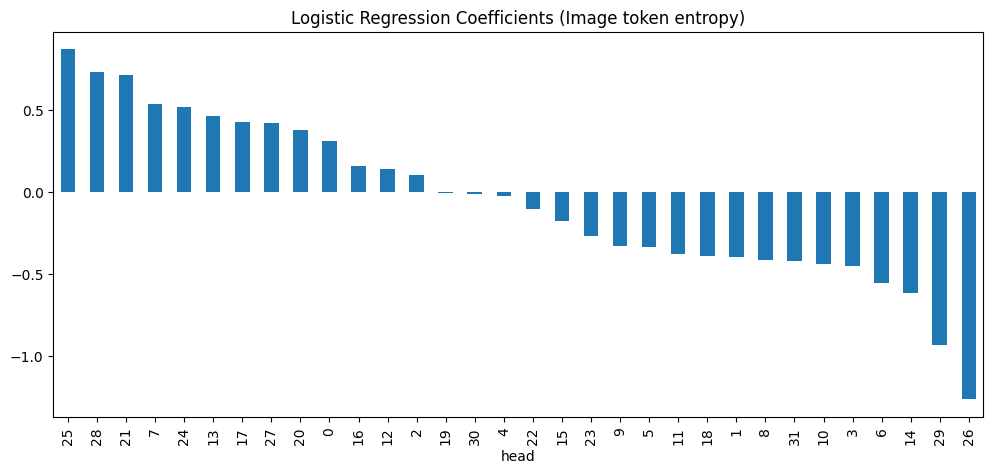

In [71]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

X = df.pivot_table(index="sample_id", columns="head", values="entropy_img")
y = df.groupby("sample_id")["hallucination"].first()

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

clf = LogisticRegression(max_iter=1000)
clf.fit(X_scaled, y)

importance = pd.Series(clf.coef_[0], index=X.columns)
importance.sort_values(ascending=False).plot(kind="bar", figsize=(12, 5))
plt.title("Logistic Regression Coefficients (Image token entropy)")
plt.show()


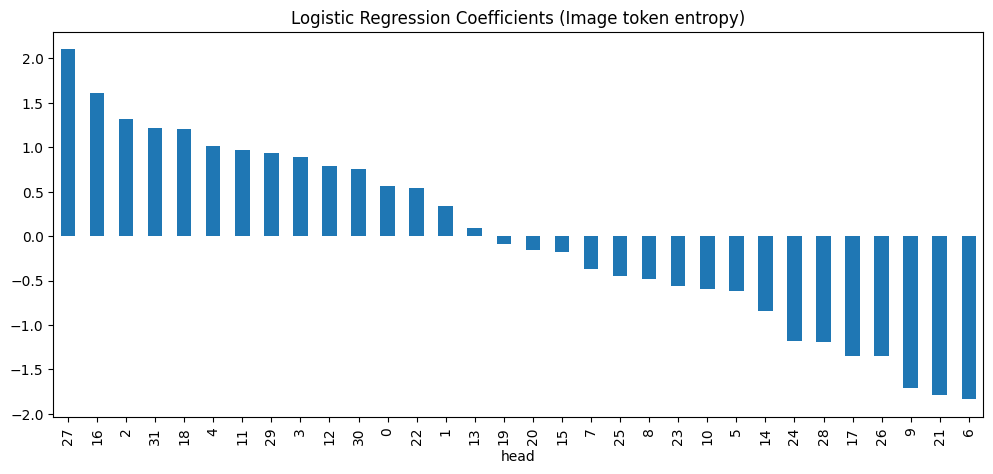

In [75]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

X = df.pivot_table(index="sample_id", columns="head", values="entropy_non_img")
y = df.groupby("sample_id")["hallucination"].first()

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

clf = LogisticRegression(max_iter=1000)
clf.fit(X_scaled, y)

importance = pd.Series(clf.coef_[0], index=X.columns)
importance.sort_values(ascending=False).plot(kind="bar", figsize=(12, 5))
plt.title("Logistic Regression Coefficients (Image token entropy)")
plt.show()


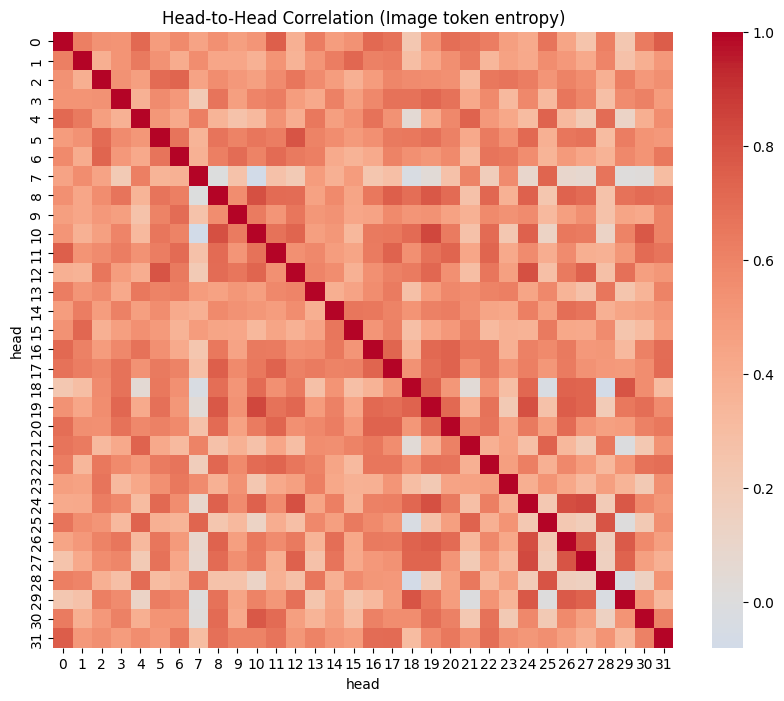

In [72]:
corr = df.pivot_table(index="sample_id", columns="head", values="entropy_img").corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, cmap="coolwarm", center=0)
plt.title("Head-to-Head Correlation (Image token entropy)")
plt.show()


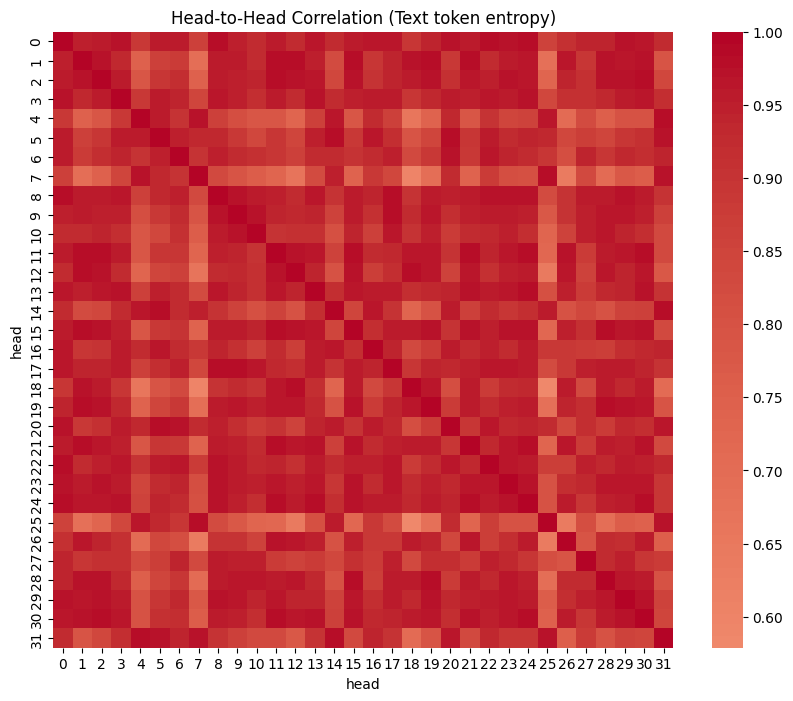

In [73]:
corr = df.pivot_table(index="sample_id", columns="head", values="entropy_non_img").corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, cmap="coolwarm", center=0)
plt.title("Head-to-Head Correlation (Text token entropy)")
plt.show()

Correlation (Ablation Accuracy vs Image Entropy): 0.066
Correlation (Ablation Accuracy vs Text Entropy): -0.005
Spearman Rank Corr (Acc vs Image Entropy): 0.072
Spearman Rank Corr (Acc vs Text Entropy): 0.004


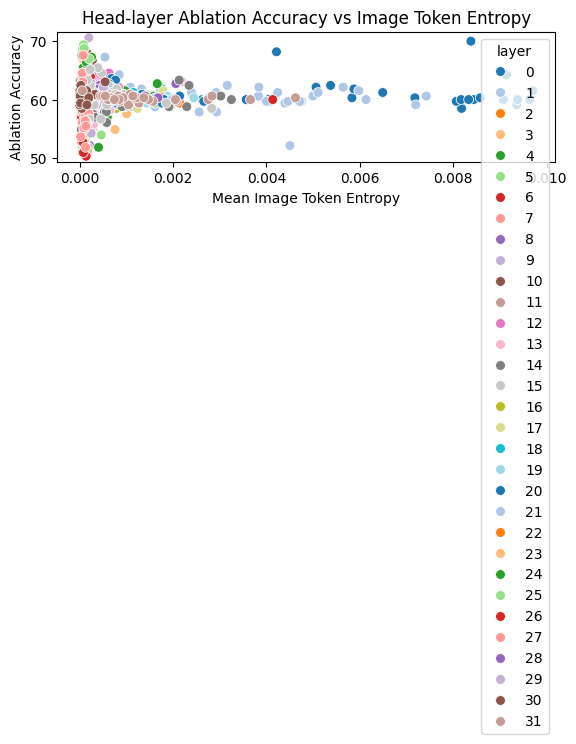

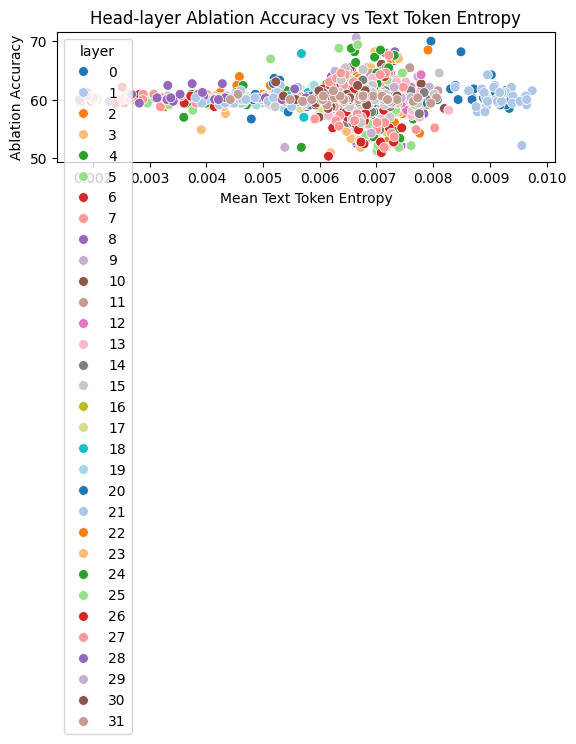

/tmp/ipykernel_3563240/3667104134.py:98: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_merged, x="head", y="Individual accuracy", ci=None)


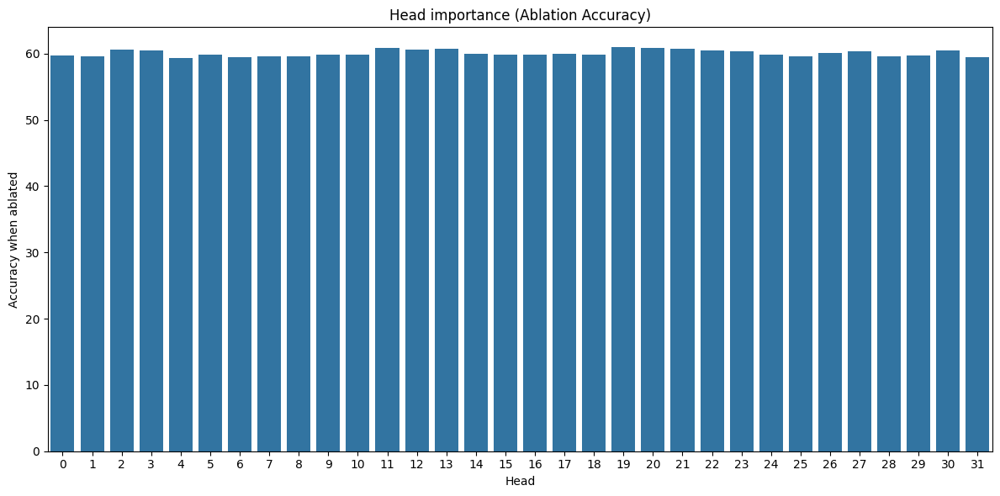

/tmp/ipykernel_3563240/3667104134.py:106: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_merged, x="head", y="entropy_img", ci=None)


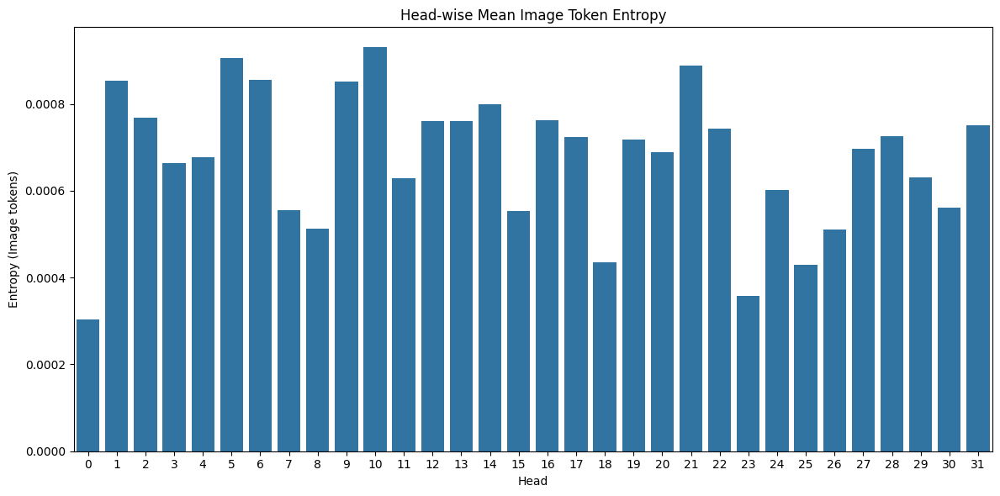

/tmp/ipykernel_3563240/3667104134.py:114: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_merged, x="head", y="entropy_non_img", ci=None)


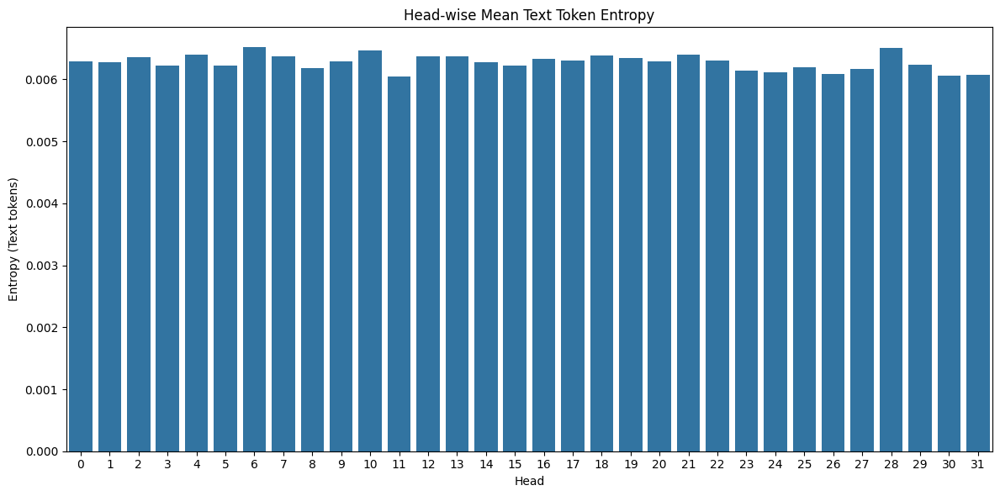

In [76]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr

# ========================================
# 1. Ablation Accuracy 데이터 불러오기
# ========================================
res_path = '/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5/res.json'

results = []
with open(res_path, "r", encoding="utf-8") as f:
    for line in f:
        results.append(json.loads(line))

df_acc = pd.DataFrame(results)
df_acc = df_acc[df_acc["method"] == "scaling_vis"]  # 특정 method만 사용

# df_acc 컬럼 예시: ["method", "layer", "head", "Individual accuracy"]

# ========================================
# 2. Entropy 데이터 불러오기
# ========================================
entropy_file = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5_attention_entropy_head/correct_attention_entropy.json"

data = []
with open(entropy_file, "r", encoding="utf-8") as f:
    for line in f:
        if line.strip():
            data.append(json.loads(line))

# 샘플 id 부여 (레이어 32개가 한 샘플)
layers_per_sample = 32
for i, entry in enumerate(data):
    sample_id = i // layers_per_sample
    entry["sample_id"] = sample_id

# DataFrame 변환
records = []
for entry in data:
    layer = entry["layer"]
    for h in entry["heads"]:
        records.append({
            "layer": layer,
            "head": h["head"],
            "entropy_img": h["entropy_img"],
            "entropy_non_img": h["entropy_non_img"]
        })

df_entropy = pd.DataFrame(records)

# layer-head별 평균 엔트로피
df_entropy_mean = df_entropy.groupby(["layer", "head"])[["entropy_img", "entropy_non_img"]].mean().reset_index()

# ========================================
# 3. Merge (layer, head 기준)
# ========================================
df_merged = pd.merge(df_acc, df_entropy_mean, on=["layer", "head"])

# ========================================
# 4. 상관관계 분석
# ========================================
corr_img = df_merged["Individual accuracy"].corr(df_merged["entropy_img"])
corr_non_img = df_merged["Individual accuracy"].corr(df_merged["entropy_non_img"])

print(f"Correlation (Ablation Accuracy vs Image Entropy): {corr_img:.3f}")
print(f"Correlation (Ablation Accuracy vs Text Entropy): {corr_non_img:.3f}")

rho_img, _ = spearmanr(df_merged["Individual accuracy"], df_merged["entropy_img"])
rho_non_img, _ = spearmanr(df_merged["Individual accuracy"], df_merged["entropy_non_img"])
print(f"Spearman Rank Corr (Acc vs Image Entropy): {rho_img:.3f}")
print(f"Spearman Rank Corr (Acc vs Text Entropy): {rho_non_img:.3f}")

# ========================================
# 5. Scatter Plot 시각화
# ========================================
plt.figure(figsize=(6,5))
sns.scatterplot(data=df_merged, x="entropy_img", y="Individual accuracy", hue="layer", palette="tab20", s=50)
plt.title("Head-layer Ablation Accuracy vs Image Token Entropy")
plt.xlabel("Mean Image Token Entropy")
plt.ylabel("Ablation Accuracy")
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,5))
sns.scatterplot(data=df_merged, x="entropy_non_img", y="Individual accuracy", hue="layer", palette="tab20", s=50)
plt.title("Head-layer Ablation Accuracy vs Text Token Entropy")
plt.xlabel("Mean Text Token Entropy")
plt.ylabel("Ablation Accuracy")
plt.tight_layout()
plt.show()

# ========================================
# 6. Head별 중요도 바플롯 (ΔAccuracy vs Entropy)
# ========================================
plt.figure(figsize=(12,6))
sns.barplot(data=df_merged, x="head", y="Individual accuracy", ci=None)
plt.title("Head importance (Ablation Accuracy)")
plt.xlabel("Head")
plt.ylabel("Accuracy when ablated")
plt.tight_layout()
plt.show()

plt.figure(figsize=(12,6))
sns.barplot(data=df_merged, x="head", y="entropy_img", ci=None)
plt.title("Head-wise Mean Image Token Entropy")
plt.xlabel("Head")
plt.ylabel("Entropy (Image tokens)")
plt.tight_layout()
plt.show()

plt.figure(figsize=(12,6))
sns.barplot(data=df_merged, x="head", y="entropy_non_img", ci=None)
plt.title("Head-wise Mean Text Token Entropy")
plt.xlabel("Head")
plt.ylabel("Entropy (Text tokens)")
plt.tight_layout()
plt.show()


Baseline Logistic Regression AUC: 0.618


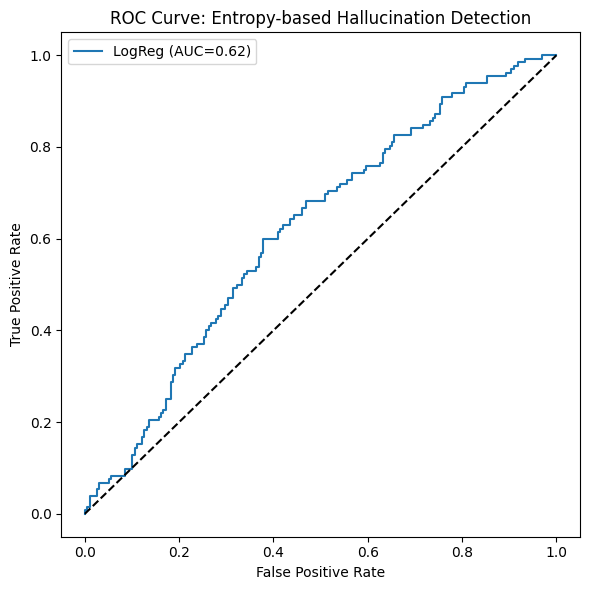

In [77]:
import json
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# ======================
# 1. Entropy 데이터 불러오기
# ======================
entropy_file = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5_attention_entropy_head/correct_attention_entropy.json"

data = []
with open(entropy_file, "r", encoding="utf-8") as f:
    for line in f:
        if line.strip():
            data.append(json.loads(line))

# 샘플 id 부여 (레이어 32개가 한 샘플)
layers_per_sample = 32
for i, entry in enumerate(data):
    sample_id = i // layers_per_sample
    entry["sample_id"] = sample_id

records = []
for entry in data:
    sample_id = entry["sample_id"]
    for h in entry["heads"]:
        records.append({
            "sample_id": sample_id,
            "layer": entry["layer"],
            "head": h["head"],
            "entropy_img": h["entropy_img"],
            "entropy_non_img": h["entropy_non_img"]
        })

df_entropy = pd.DataFrame(records)

# ======================
# 2. Hallucination 라벨 불러오기
# ======================
result_file = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/results1.5_Controlled_Images_A_fuzzy_measure_0.01_fouroption_True_layer0_head0.json"

with open(result_file, "r", encoding="utf-8") as f:
    results = json.load(f)

hallucination_labels = {}
for idx, sample in enumerate(results):
    hallucination_labels[idx] = 0 if sample["Generation"].strip() == sample["Golden"].strip() else 1

df_entropy["hallucination"] = df_entropy["sample_id"].map(hallucination_labels)

# ======================
# 3. 샘플 단위로 feature 집계 (평균 엔트로피)
# ======================
df_features = (
    df_entropy.groupby("sample_id")[["entropy_img", "entropy_non_img"]]
    .mean()
    .reset_index()
)
df_features["hallucination"] = df_features["sample_id"].map(hallucination_labels)

# ======================
# 4. 로지스틱 회귀로 분류 실험
# ======================
X = df_features[["entropy_img", "entropy_non_img"]].values
y = df_features["hallucination"].values

clf = LogisticRegression()
clf.fit(X, y)

# 예측 확률
y_pred = clf.predict_proba(X)[:, 1]

# ROC-AUC 계산
auc = roc_auc_score(y, y_pred)
print(f"Baseline Logistic Regression AUC: {auc:.3f}")

# ======================
# 5. ROC Curve 시각화
# ======================
fpr, tpr, _ = roc_curve(y, y_pred)
plt.figure(figsize=(6,6))
plt.plot(fpr, tpr, label=f"LogReg (AUC={auc:.2f})")
plt.plot([0,1],[0,1],'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve: Entropy-based Hallucination Detection")
plt.legend()
plt.tight_layout()
plt.show()


    head       AUC  pval_img  pval_non_img
12    12  0.509800  0.562944      0.332733
19    19  0.509692  0.173117      0.440168
26    26  0.509594  0.674938      0.335057
10    10  0.509055  0.653675      0.366018
18    18  0.508580  0.000100      0.275998
24    24  0.508544  0.418436      0.496752
9      9  0.507947  0.227973      0.344357
5      5  0.506484  0.389692      0.497095
21    21  0.506352  0.626992      0.197028
13    13  0.506134  0.552272      0.335920
29    29  0.505846  0.314646      0.580116
17    17  0.505500  0.051991      0.394561
3      3  0.505391  0.031599      0.406054
6      6  0.505383  0.531296      0.443696
28    28  0.505346  0.256658      0.305001
14    14  0.505330  0.051177      0.438698
20    20  0.505126  0.094285      0.482654
23    23  0.504994  0.813896      0.427683
8      8  0.504911  0.139545      0.545452
15    15  0.504705  0.749560      0.442704
7      7  0.504433  0.833784      0.438303
30    30  0.504356  0.031985      0.612416
0      0  0

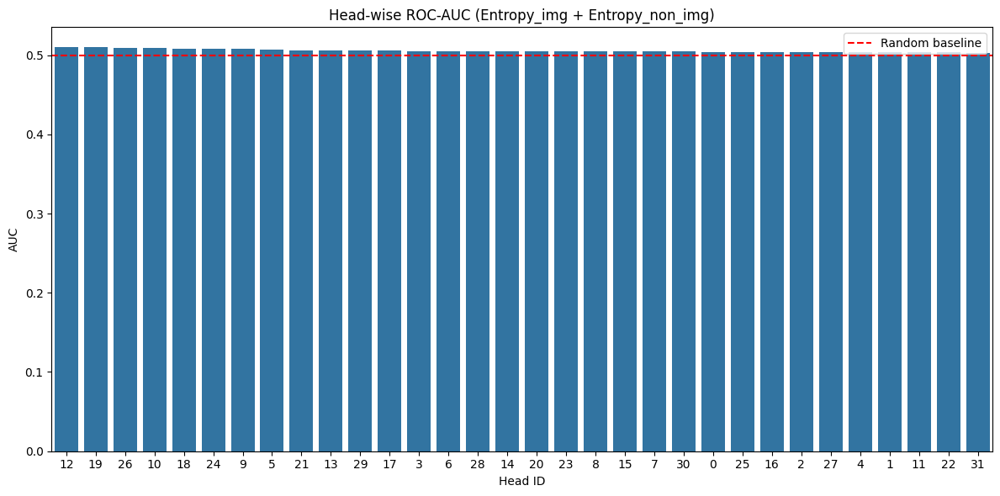

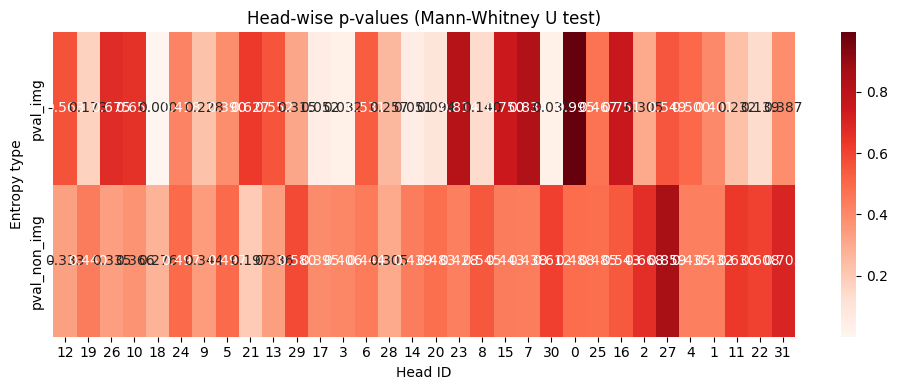

In [79]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from scipy.stats import ttest_ind, mannwhitneyu

# ======================
# 1. 데이터 불러오기
# ======================
entropy_file = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5_attention_entropy_head/correct_attention_entropy.json"
label_file = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/results1.5_Controlled_Images_A_fuzzy_measure_0.01_fouroption_True_layer0_head0.json"

# Entropy 데이터
data = []
with open(entropy_file, "r", encoding="utf-8") as f:
    for line in f:
        if line.strip():
            data.append(json.loads(line))

layers_per_sample = 32
for i, entry in enumerate(data):
    entry["sample_id"] = i // layers_per_sample

records = []
for entry in data:
    sample_id = entry["sample_id"]
    for h in entry["heads"]:
        records.append({
            "sample_id": sample_id,
            "layer": entry["layer"],
            "head": h["head"],
            "entropy_img": h["entropy_img"],
            "entropy_non_img": h["entropy_non_img"]
        })
df_entropy = pd.DataFrame(records)

# 라벨 데이터
with open(label_file, "r", encoding="utf-8") as f:
    labels = json.load(f)

hallucination_labels = {idx: 0 if s["Generation"].strip() == s["Golden"].strip() else 1
                        for idx, s in enumerate(labels)}
df_entropy["hallucination"] = df_entropy["sample_id"].map(hallucination_labels)

# ======================
# 2. Head별 AUC 및 통계 검정
# ======================
head_results = []

for head_id in sorted(df_entropy["head"].unique()):
    df_head = df_entropy[df_entropy["head"] == head_id]

    y = df_head["hallucination"].values
    if len(np.unique(y)) < 2:  # 라벨이 하나만 있으면 스킵
        continue

    # 로지스틱 회귀
    X = df_head[["entropy_img", "entropy_non_img"]].values
    clf = LogisticRegression()
    clf.fit(X, y)
    y_pred = clf.predict_proba(X)[:, 1]
    auc = roc_auc_score(y, y_pred)

    # 통계 검정
    img_hallu = df_head[df_head["hallucination"] == 1]["entropy_img"].values
    img_non = df_head[df_head["hallucination"] == 0]["entropy_img"].values
    nonimg_hallu = df_head[df_head["hallucination"] == 1]["entropy_non_img"].values
    nonimg_non = df_head[df_head["hallucination"] == 0]["entropy_non_img"].values

    u_p_img = mannwhitneyu(img_hallu, img_non, alternative="two-sided").pvalue if len(img_hallu) > 1 and len(img_non) > 1 else np.nan
    u_p_non = mannwhitneyu(nonimg_hallu, nonimg_non, alternative="two-sided").pvalue if len(nonimg_hallu) > 1 and len(nonimg_non) > 1 else np.nan

    head_results.append({
        "head": head_id,
        "AUC": auc,
        "pval_img": u_p_img,
        "pval_non_img": u_p_non
    })

df_head_results = pd.DataFrame(head_results).sort_values("AUC", ascending=False)
print(df_head_results)

# ======================
# 3. 시각화 (AUC Ranking)
# ======================
plt.figure(figsize=(12,6))
sns.barplot(data=df_head_results, x="head", y="AUC", order=df_head_results["head"])
plt.axhline(0.5, color="red", linestyle="--", label="Random baseline")
plt.title("Head-wise ROC-AUC (Entropy_img + Entropy_non_img)")
plt.xlabel("Head ID")
plt.ylabel("AUC")
plt.legend()
plt.tight_layout()
plt.show()

# ======================
# 4. 시각화 (p-value Heatmap)
# ======================
pvals = df_head_results.set_index("head")[["pval_img", "pval_non_img"]]
plt.figure(figsize=(10,4))
sns.heatmap(pvals.T, cmap="Reds", annot=True, fmt=".3f", cbar=True)
plt.title("Head-wise p-values (Mann-Whitney U test)")
plt.xlabel("Head ID")
plt.ylabel("Entropy type")
plt.tight_layout()
plt.show()


    head       AUC
28    28  0.507877
25    25  0.507643
4      4  0.506958
21    21  0.506560
7      7  0.504010
1      1  0.503439
13    13  0.503240
12    12  0.502865
16    16  0.502585
0      0  0.502327
31    31  0.501670
6      6  0.501338
9      9  0.501207
15    15  0.500824
3      3  0.500550
22    22  0.500005
17    17  0.499848
24    24  0.499683
23    23  0.499552
14    14  0.499262
2      2  0.498030
5      5  0.498002
11    11  0.497967
26    26  0.497607
8      8  0.497548
20    20  0.496690
30    30  0.496004
10    10  0.494858
19    19  0.494388
29    29  0.493161
18    18  0.492854
27    27  0.492285


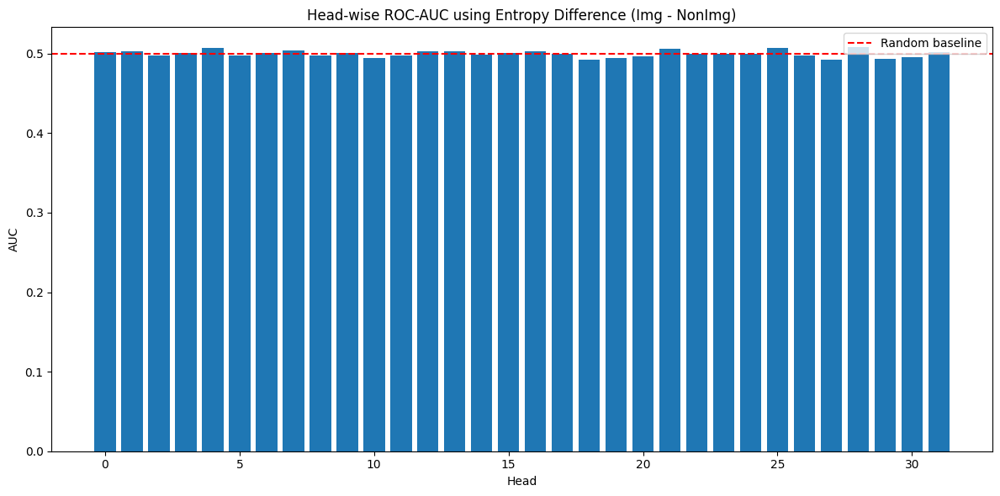

In [80]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# df_entropy: 이전 단계에서 만든 데이터프레임 (head별 entropy와 hallucination label 포함)

# 새로운 feature 추가
df_entropy["entropy_diff"] = df_entropy["entropy_img"] - df_entropy["entropy_non_img"]

head_results = []

for head_id in sorted(df_entropy["head"].unique()):
    df_head = df_entropy[df_entropy["head"] == head_id]

    y = df_head["hallucination"].values
    if len(np.unique(y)) < 2:
        continue  # 라벨이 하나뿐이면 스킵

    X = df_head[["entropy_diff"]].values  # 단일 feature 사용
    clf = LogisticRegression()
    clf.fit(X, y)
    y_pred = clf.predict_proba(X)[:, 1]

    auc = roc_auc_score(y, y_pred)
    head_results.append({"head": head_id, "AUC": auc})

# DataFrame 정리
df_head_auc = pd.DataFrame(head_results).sort_values("AUC", ascending=False)
print(df_head_auc)

# 시각화
plt.figure(figsize=(12,6))
plt.bar(df_head_auc["head"], df_head_auc["AUC"])
plt.axhline(0.5, color="red", linestyle="--", label="Random baseline")
plt.xlabel("Head")
plt.ylabel("AUC")
plt.title("Head-wise ROC-AUC using Entropy Difference (Img - NonImg)")
plt.legend()
plt.tight_layout()
plt.show()



[Top (layer, head) candidates by best AUC]
      layer  head  best_auc   best_combo
474      14    26  0.950911  all_metrics
606      18    30  0.947467  all_metrics
622      19    14  0.945478  all_metrics
579      18     3  0.941881  all_metrics
772      24     4  0.940350  all_metrics
584      18     8  0.937137  all_metrics
605      18    29  0.934611  all_metrics
544      17     0  0.933961  all_metrics
1008     31    16  0.933387  all_metrics
677      21     5  0.930785  all_metrics
660      20    20  0.928183  all_metrics
477      14    29  0.923439  all_metrics
457      14     9  0.921449  all_metrics
552      17     8  0.921258  all_metrics
600      18    24  0.919268  all_metrics
607      18    31  0.918427  all_metrics
563      17    19  0.916667  all_metrics
484      15     4  0.916016  all_metrics
703      21    31  0.915213  all_metrics
582      18     6  0.915098  all_metrics


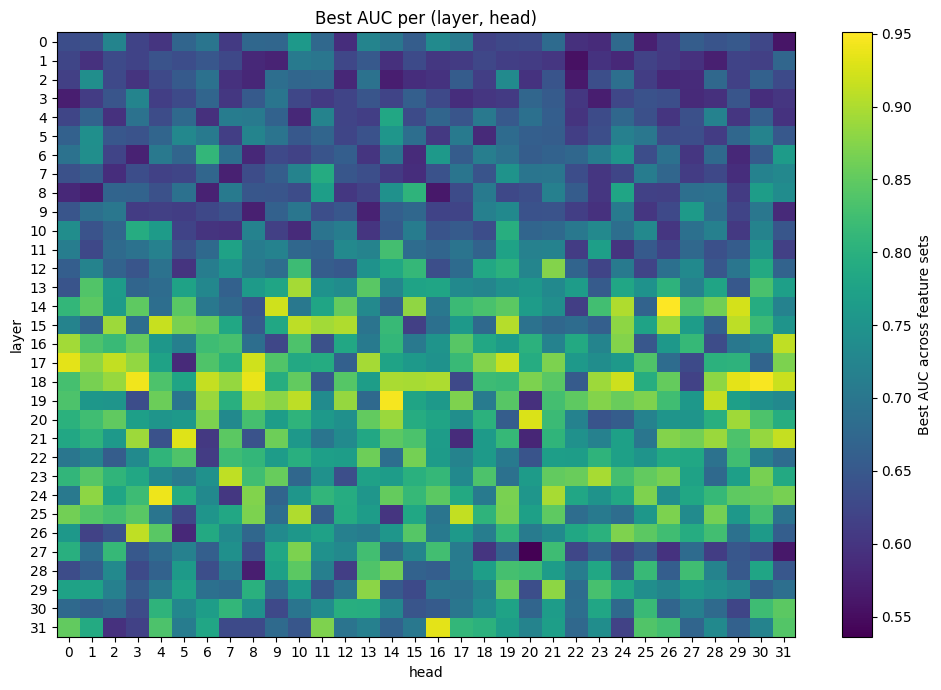

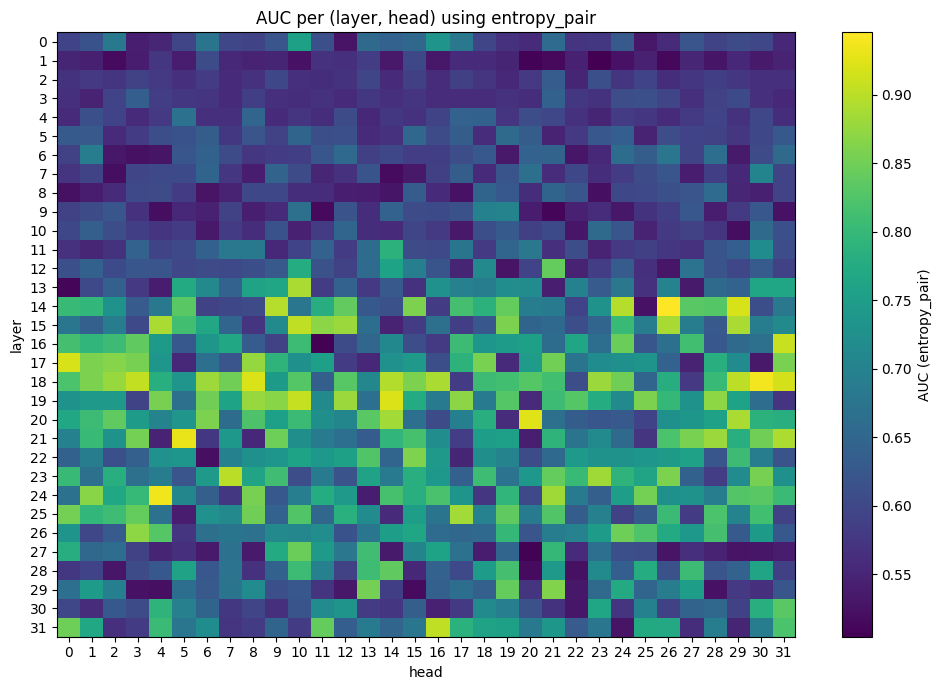

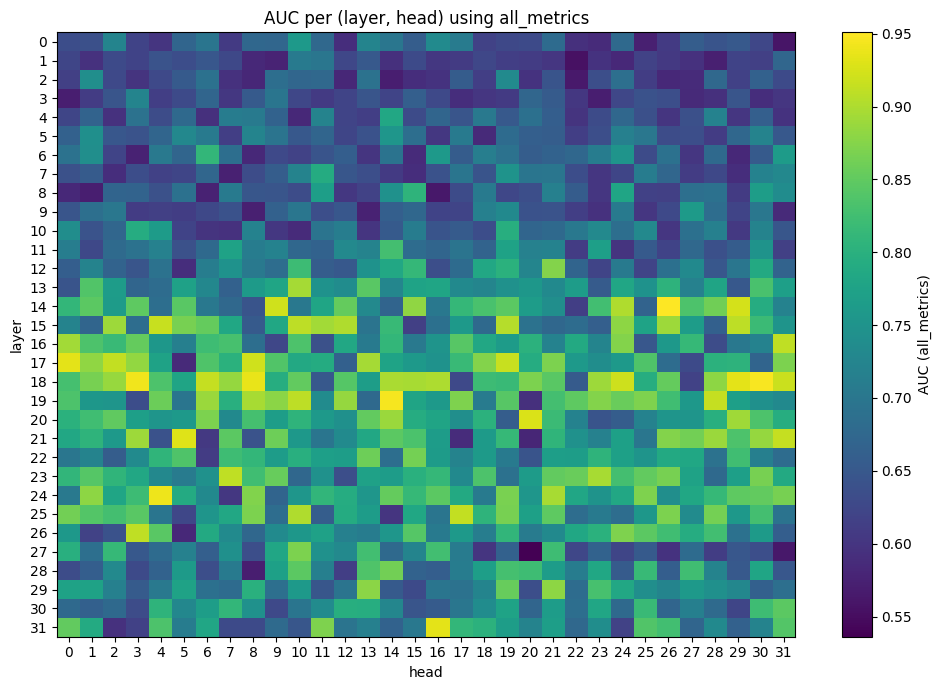

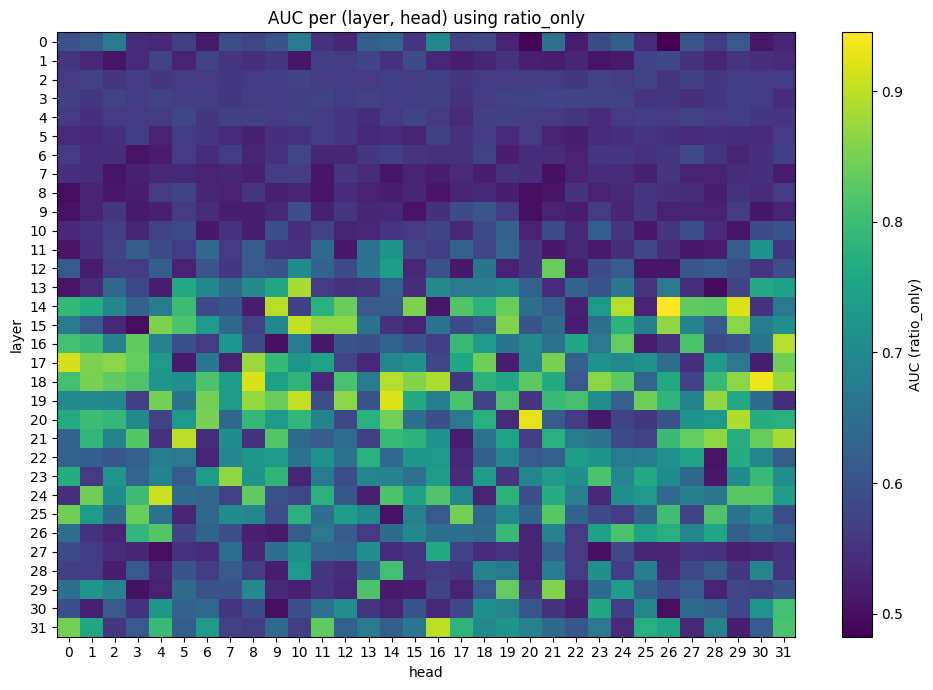

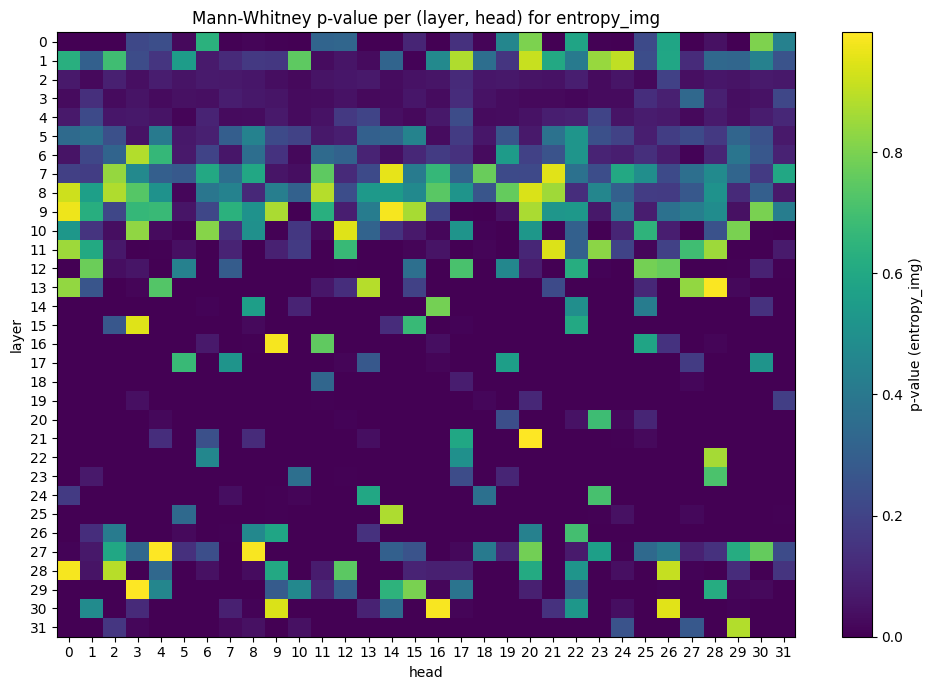

...

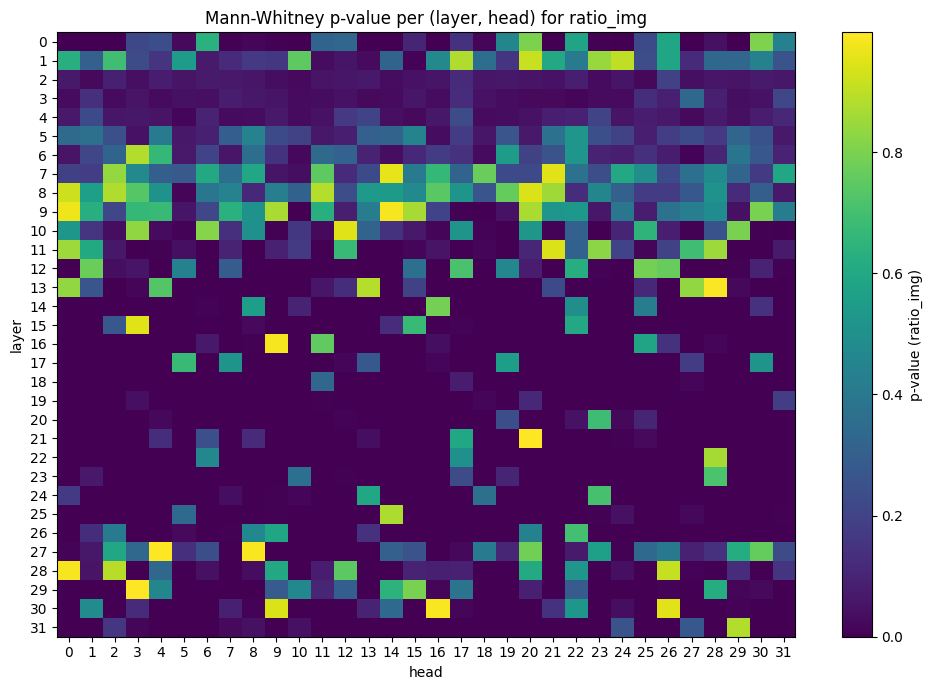

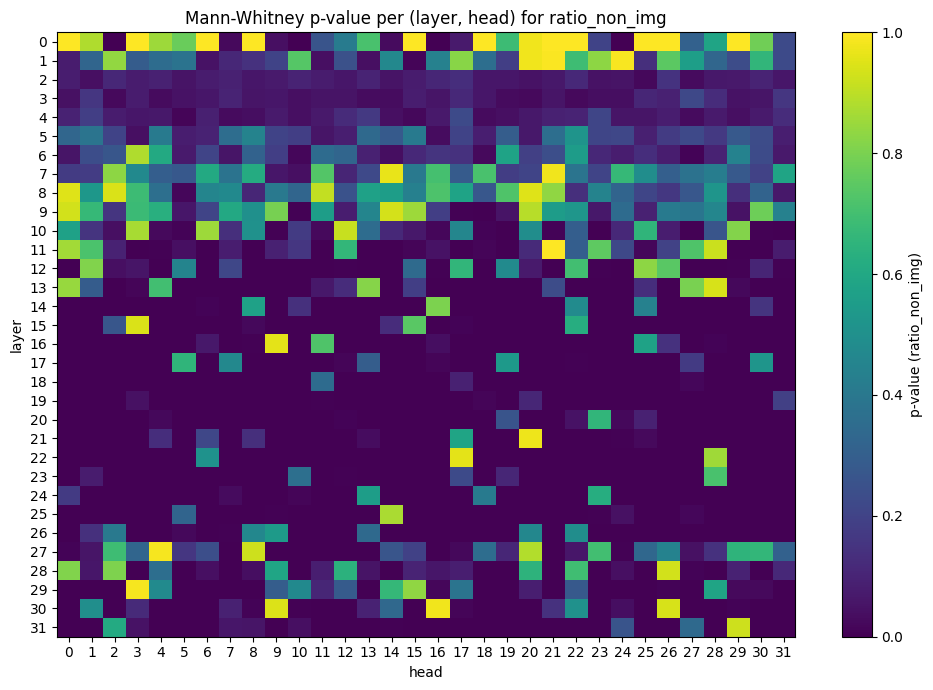

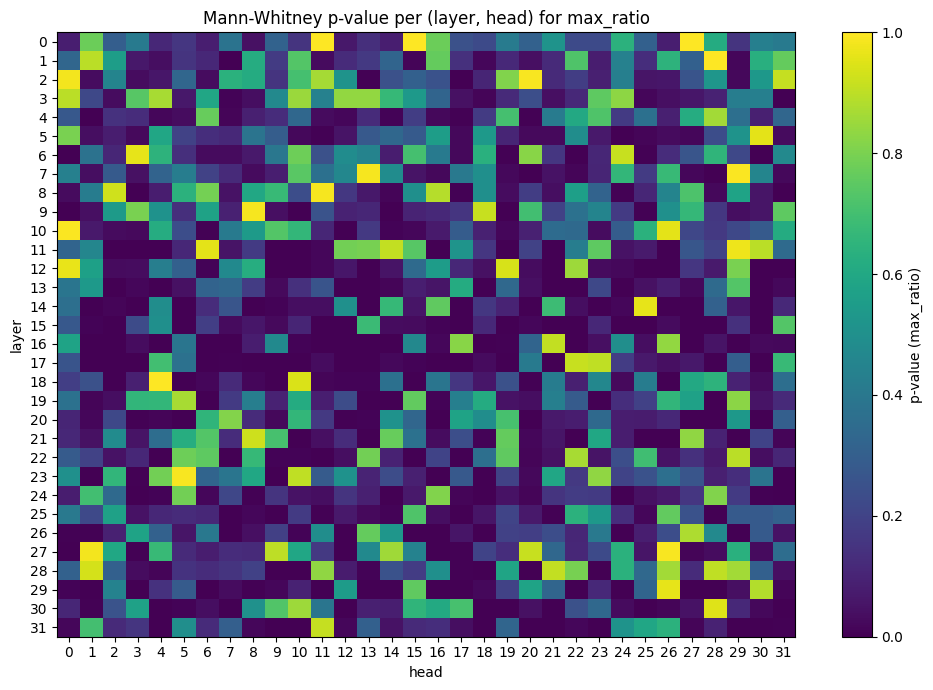

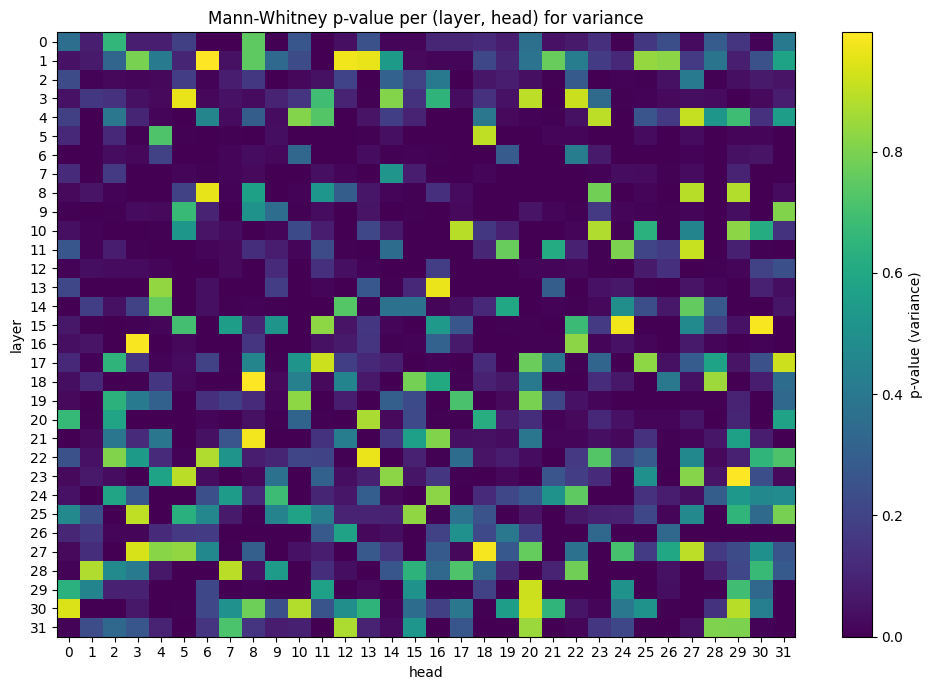

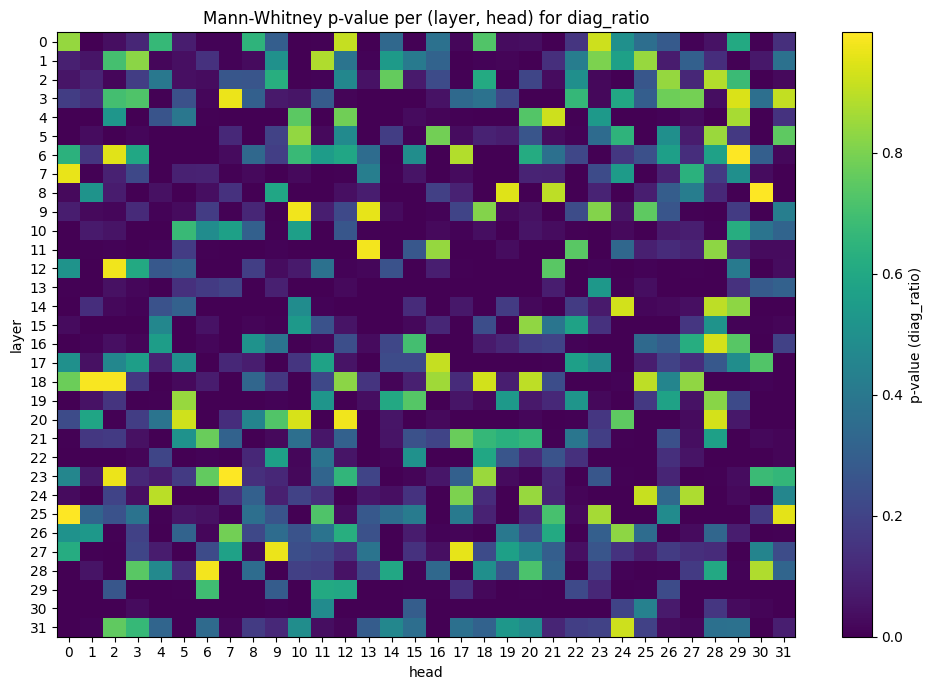


Correlation between best AUC and Ablation Accuracy across (layer, head): 0.039


In [83]:
import json
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from scipy.stats import mannwhitneyu

from typing import Optional, List

# ======================
# 0) 파일 경로
# ======================
METRICS_FILE = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5_attention_entropy_head/correct_attention_entropy_all_matrics.json"
LABEL_FILE   = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/results1.5_Controlled_Images_A_fuzzy_measure_0.01_fouroption_True_layer0_head0.json"
# (선택) 헤드 억제 정확도 결과를 추가로 보려면 아래 경로도 사용
RES_JSON = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5/res.json"

LAYERS_PER_SAMPLE = 32

# 사용할 단일 지표들
METRIC_LIST = [
    "entropy_img", "entropy_non_img", "entropy_diff",
    "ratio_img", "ratio_non_img", "max_ratio", "variance", "diag_ratio"
]

# 사용할 다중피처 묶음(조합)들: (조합 이름, 피처 리스트)
FEATURE_SETS = [
    ("entropy_pair", ["entropy_img", "entropy_non_img"]),
    ("all_metrics", METRIC_LIST),
    ("ratio_only", ["ratio_img", "ratio_non_img"]),
]

# ======================
# 1) 지표 JSON 로드 → (sample_id, layer, head)별 DF
# ======================
rows = []
with open(METRICS_FILE, "r", encoding="utf-8") as f:
    for i, line in enumerate(f):
        if not line.strip():
            continue
        obj = json.loads(line)
        obj["sample_id"] = i // LAYERS_PER_SAMPLE
        layer = obj["layer"]
        for h in obj["heads"]:
            r = {
                "sample_id": obj["sample_id"],
                "layer": layer,
                "head": h["head"],
            }
            for k in METRIC_LIST:
                r[k] = float(h[k])
            rows.append(r)

df = pd.DataFrame(rows)

# ======================
# 2) 라벨 로드 (Generation vs Golden) → hallucination(0/1)
# ======================
with open(LABEL_FILE, "r", encoding="utf-8") as f:
    label_objs = json.load(f)

hallu_map = {
    idx: 0 if s["Generation"].strip() == s["Golden"].strip() else 1
    for idx, s in enumerate(label_objs)
}
df["hallucination"] = df["sample_id"].map(hallu_map)

# ======================
# 3) (layer, head)별 평가 함수들
# ======================
def auc_for_features(df_pair: pd.DataFrame, features: List[str]) -> Optional[float]:
    """해당 (layer, head) pair에서 주어진 features로 로지스틱 회귀 AUC 계산."""
    y = df_pair["hallucination"].values
    if len(np.unique(y)) < 2:
        return np.nan
    X = df_pair[features].values
    # 표준화 + 로지스틱 회귀 파이프라인
    clf = Pipeline([
        ("scaler", StandardScaler(with_mean=True, with_std=True)),
        ("lr", LogisticRegression(solver="liblinear"))
    ])
    try:
        clf.fit(X, y)
        y_score = clf.predict_proba(X)[:, 1]
        return roc_auc_score(y, y_score)
    except Exception:
        return np.nan

def pvalue_for_metric(df_pair: pd.DataFrame, metric: str) -> float:
    """해당 (layer, head) pair에서 단일 metric의 분포차(p-value, Mann–Whitney)."""
    g1 = df_pair[df_pair["hallucination"] == 1][metric].values
    g0 = df_pair[df_pair["hallucination"] == 0][metric].values
    if len(g1) < 2 or len(g0) < 2:
        return np.nan
    try:
        return mannwhitneyu(g1, g0, alternative="two-sided").pvalue
    except Exception:
        return np.nan

# ======================
# 4) (layer, head)별로 전 지표/조합 평가
# ======================
pair_results = []
for (layer, head), df_pair in df.groupby(["layer", "head"]):
    # 단일 지표 p-value
    metric_pvals = {m: pvalue_for_metric(df_pair, m) for m in METRIC_LIST}
    # 피처 조합 AUC
    combo_aucs = {name: auc_for_features(df_pair, feats) for name, feats in FEATURE_SETS}

    rec = {"layer": layer, "head": head}
    # AUC들
    for name, aucv in combo_aucs.items():
        rec[f"AUC::{name}"] = aucv
    # p-value들
    for m, pv in metric_pvals.items():
        rec[f"pval::{m}"] = pv
    # 효과크기(참고): 평균 차이(할루-정상)
    for m in METRIC_LIST:
        mean_h = df_pair[df_pair["hallucination"] == 1][m].mean()
        mean_n = df_pair[df_pair["hallucination"] == 0][m].mean()
        rec[f"delta::{m}"] = (mean_h - mean_n)
    pair_results.append(rec)

df_pairs = pd.DataFrame(pair_results)

# ======================
# 5) 보기 좋은 요약: (layer, head)별 베스트 조합 선정
# ======================
auc_cols = [c for c in df_pairs.columns if c.startswith("AUC::")]
df_pairs["best_auc"] = df_pairs[auc_cols].max(axis=1)
df_pairs["best_combo"] = df_pairs[auc_cols].idxmax(axis=1).str.replace("AUC::", "", regex=False)

# 상위 N개 (layer, head) 후보 출력
TOP_N = 20
top_pairs = df_pairs.sort_values("best_auc", ascending=False).head(TOP_N)
print("\n[Top (layer, head) candidates by best AUC]")
print(top_pairs[["layer", "head", "best_auc", "best_combo"]])

# ======================
# 6) 시각화
# ======================

# (A) (layer, head) 그리드에 best AUC 히트맵
pivot_best = df_pairs.pivot(index="layer", columns="head", values="best_auc")
plt.figure(figsize=(10, 7))
im = plt.imshow(pivot_best.values, aspect="auto")
plt.colorbar(im, label="Best AUC across feature sets")
plt.xticks(ticks=range(len(pivot_best.columns)), labels=pivot_best.columns)
plt.yticks(ticks=range(len(pivot_best.index)), labels=pivot_best.index)
plt.xlabel("head")
plt.ylabel("layer")
plt.title("Best AUC per (layer, head)")
plt.tight_layout()
plt.show()

# (B) 조합별 AUC 히트맵(예: entropy_pair)
for combo_name, _ in FEATURE_SETS:
    pivot_combo = df_pairs.pivot(index="layer", columns="head", values=f"AUC::{combo_name}")
    plt.figure(figsize=(10, 7))
    im = plt.imshow(pivot_combo.values, aspect="auto")
    plt.colorbar(im, label=f"AUC ({combo_name})")
    plt.xticks(ticks=range(len(pivot_combo.columns)), labels=pivot_combo.columns)
    plt.yticks(ticks=range(len(pivot_combo.index)), labels=pivot_combo.index)
    plt.xlabel("head")
    plt.ylabel("layer")
    plt.title(f"AUC per (layer, head) using {combo_name}")
    plt.tight_layout()
    plt.show()

# (C) 단일 지표의 p-value 히트맵 (예: entropy_img, ratio_img 등)
for metric in METRIC_LIST:
    pivot_p = df_pairs.pivot(index="layer", columns="head", values=f"pval::{metric}")
    plt.figure(figsize=(10, 7))
    im = plt.imshow(pivot_p.values, aspect="auto")
    plt.colorbar(im, label=f"p-value ({metric})")
    plt.xticks(ticks=range(len(pivot_p.columns)), labels=pivot_p.columns)
    plt.yticks(ticks=range(len(pivot_p.index)), labels=pivot_p.index)
    plt.xlabel("head")
    plt.ylabel("layer")
    plt.title(f"Mann-Whitney p-value per (layer, head) for {metric}")
    plt.tight_layout()
    plt.show()

# ======================
# 7) (선택) 억제 정확도(res.json)와의 정합성도 확인
#     같은 (layer, head) 좌표에서 AUC(탐지력)와
#     ablating-accuracy가 어느 정도 일관되는지 상관 확인
# ======================
try:
    res_rows = []
    with open(RES_JSON, "r", encoding="utf-8") as f:
        for line in f:
            if line.strip():
                res_rows.append(json.loads(line))
    df_res = pd.DataFrame(res_rows)
    # 필요한 컬럼만 필터링
    df_res = df_res[df_res["method"] == "scaling_vis"][["layer", "head", "Individual accuracy"]].copy()
    df_merge = pd.merge(df_pairs, df_res, on=["layer", "head"], how="inner")
    corr = df_merge["best_auc"].corr(df_merge["Individual accuracy"])
    print(f"\nCorrelation between best AUC and Ablation Accuracy across (layer, head): {corr:.3f}")
except Exception as e:
    print("\n[참고] res.json을 못 불러오거나 포맷이 다릅니다. 상관 분석을 건너뜁니다.")


Correlation (fuzzy_score vs accuracy): -0.065

평균 fuzzy score (accuracy <60 vs ≥60):
acc_ge60
0    0.242999
1    0.239755
Name: fuzzy_score, dtype: float64


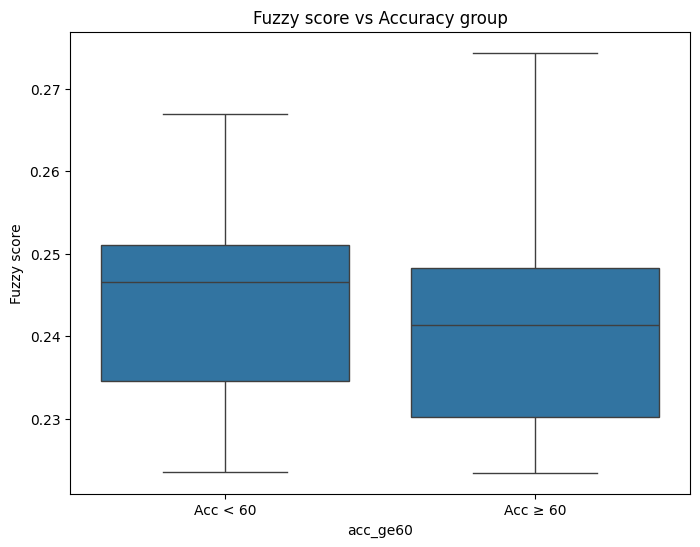

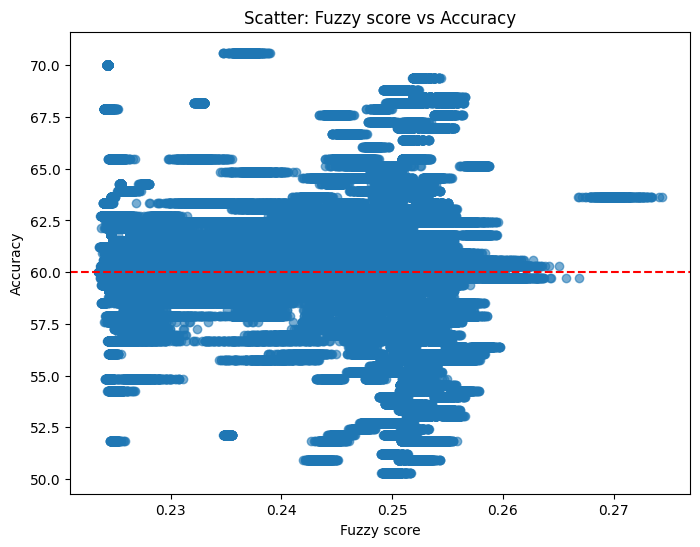

In [84]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ---------------------
# 1. Ablation accuracy 로드
# ---------------------
results = []
res_path = '/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5/res.json'
with open(res_path, "r", encoding="utf-8") as f:
    for line in f:
        results.append(json.loads(line))

df_acc = pd.DataFrame(results)
df_acc = df_acc[df_acc["method"] == "scaling_vis"]
df_acc = df_acc[["layer", "head", "Individual accuracy"]]

# ---------------------
# 2. Attention metrics 로드
# ---------------------
metrics_file = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5_attention_entropy_head/correct_attention_entropy_all_matrics.json"

data = []
with open(metrics_file, "r", encoding="utf-8") as f:
    for i, line in enumerate(f):
        if not line.strip():
            continue
        obj = json.loads(line)
        layer = obj["layer"]
        for h in obj["heads"]:
            r = {"layer": layer, "head": h["head"]}
            r.update(h)  # entropy_img, entropy_non_img 등 지표들 추가
            data.append(r)

df_metrics = pd.DataFrame(data)

# ---------------------
# 3. 퍼지 적분 함수 (단순 Choquet-style)
# ---------------------
def fuzzy_integral(row, features):
    vals = np.array([row[f] for f in features])
    vals_sorted = np.sort(vals)[::-1]  # 내림차순
    weights = np.linspace(1, 0, len(vals), endpoint=False)  # 단순 선형 감소 가중치
    return np.sum(vals_sorted * weights) / np.sum(weights)

features = ["entropy_img", "entropy_non_img", "entropy_diff",
            "ratio_img", "ratio_non_img", "max_ratio", "variance", "diag_ratio"]

df_metrics["fuzzy_score"] = df_metrics.apply(lambda r: fuzzy_integral(r, features), axis=1)

# ---------------------
# 4. Accuracy와 결합
# ---------------------
df_merge = pd.merge(df_metrics, df_acc, on=["layer", "head"], how="inner")

# accuracy ≥ 60 여부 라벨링
df_merge["acc_ge60"] = (df_merge["Individual accuracy"] >= 60).astype(int)

# ---------------------
# 5. 상관관계 분석
# ---------------------
corr_val = df_merge["fuzzy_score"].corr(df_merge["Individual accuracy"])
print(f"Correlation (fuzzy_score vs accuracy): {corr_val:.3f}")

# 그룹 평균 비교
group_means = df_merge.groupby("acc_ge60")["fuzzy_score"].mean()
print("\n평균 fuzzy score (accuracy <60 vs ≥60):")
print(group_means)

# ---------------------
# 6. 시각화
# ---------------------
plt.figure(figsize=(8,6))
sns.boxplot(data=df_merge, x="acc_ge60", y="fuzzy_score")
plt.xticks([0,1], ["Acc < 60", "Acc ≥ 60"])
plt.ylabel("Fuzzy score")
plt.title("Fuzzy score vs Accuracy group")
plt.show()

plt.figure(figsize=(8,6))
plt.scatter(df_merge["fuzzy_score"], df_merge["Individual accuracy"], alpha=0.6)
plt.xlabel("Fuzzy score")
plt.ylabel("Accuracy")
plt.title("Scatter: Fuzzy score vs Accuracy")
plt.axhline(60, color="red", linestyle="--")
plt.show()


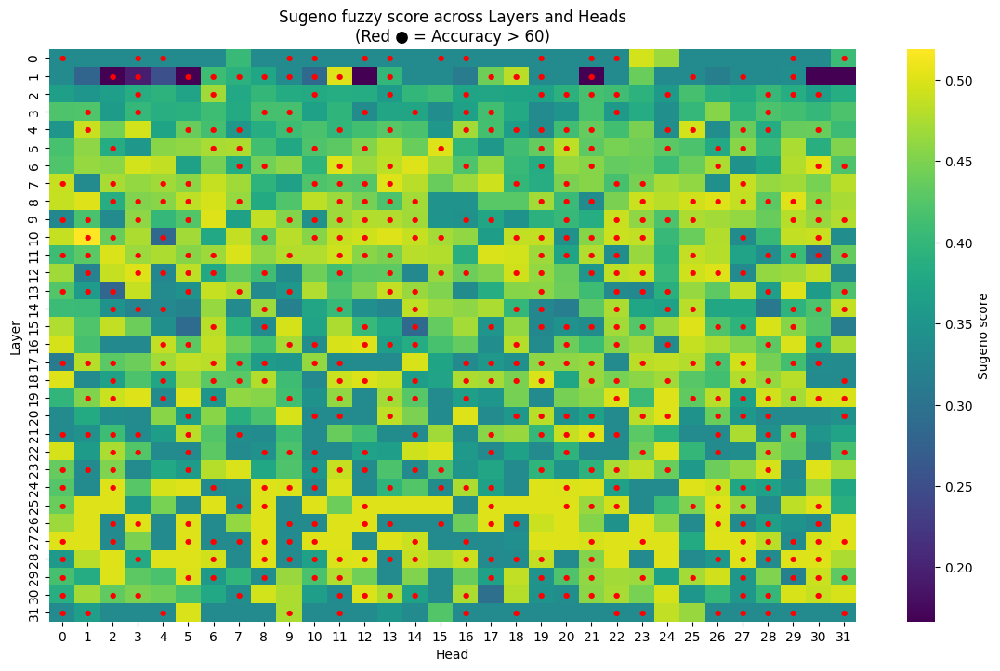

In [96]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ---------------------
# 1. Load metrics JSON
# ---------------------
metrics_file = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5_attention_entropy_head/correct_attention_entropy_all_matrics.json"

records = []
with open(metrics_file, "r", encoding="utf-8") as f:
    for line in f:
        if not line.strip():
            continue
        obj = json.loads(line)
        layer = obj["layer"]
        for h in obj["heads"]:
            rec = {"layer": layer, "head": h["head"]}
            rec.update(h)
            records.append(rec)

df_metrics = pd.DataFrame(records)

# ---------------------
# 2. Sugeno integral
# ---------------------
def sugeno_integral(values: np.ndarray) -> float:
    vals_sorted = np.sort(values)[::-1]  # descending
    n = len(vals_sorted)
    sugeno_vals = []
    for i, v in enumerate(vals_sorted, start=1):
        g_i = i / n
        sugeno_vals.append(min(v, g_i))
    return max(sugeno_vals)

features = [ "entropy_diff","ratio_img", "ratio_non_img", "max_ratio", "variance", "diag_ratio"]



# Normalize features to [0,1]
for f in features:
    min_val, max_val = df_metrics[f].min(), df_metrics[f].max()
    df_metrics[f] = (df_metrics[f] - min_val) / (max_val - min_val + 1e-12)

# Compute Sugeno score
df_metrics["sugeno_score"] = df_metrics[features].apply(lambda r: sugeno_integral(r.values), axis=1)

# ---------------------
# 3. Load ablation accuracy
# ---------------------
results = []
res_path = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5/res.json"
with open(res_path, "r", encoding="utf-8") as f:
    for line in f:
        results.append(json.loads(line))

df_acc = pd.DataFrame(results)
df_acc = df_acc[df_acc["method"] == "scaling_vis"]
df_acc = df_acc[["layer", "head", "Individual accuracy"]]

# ---------------------
# 4. Merge and handle duplicates
# ---------------------
# Average duplicate (layer, head) scores
df_merge = df_metrics.groupby(["layer", "head"], as_index=False)["sugeno_score"].mean()
df_merge = pd.merge(df_merge, df_acc, on=["layer", "head"], how="inner")

# Mark heads with accuracy > 60
df_merge["impact_head"] = (df_merge["Individual accuracy"] > 60).astype(int)

# ---------------------
# 5. Heatmap visualization
# ---------------------
pivot = df_merge.pivot(index="layer", columns="head", values="sugeno_score")

plt.figure(figsize=(14, 8))
sns.heatmap(pivot, cmap="viridis", cbar_kws={'label': 'Sugeno score'})

# Mark impact heads (accuracy > 60)
impact_points = df_merge[df_merge["impact_head"] == 1]
for _, row in impact_points.iterrows():
    plt.text(row["head"] + 0.5, row["layer"] + 0.5, "●",
             color="red", ha="center", va="center", fontsize=6)

plt.title("Sugeno fuzzy score across Layers and Heads\n(Red ● = Accuracy > 60)")
plt.xlabel("Head")
plt.ylabel("Layer")
plt.show()


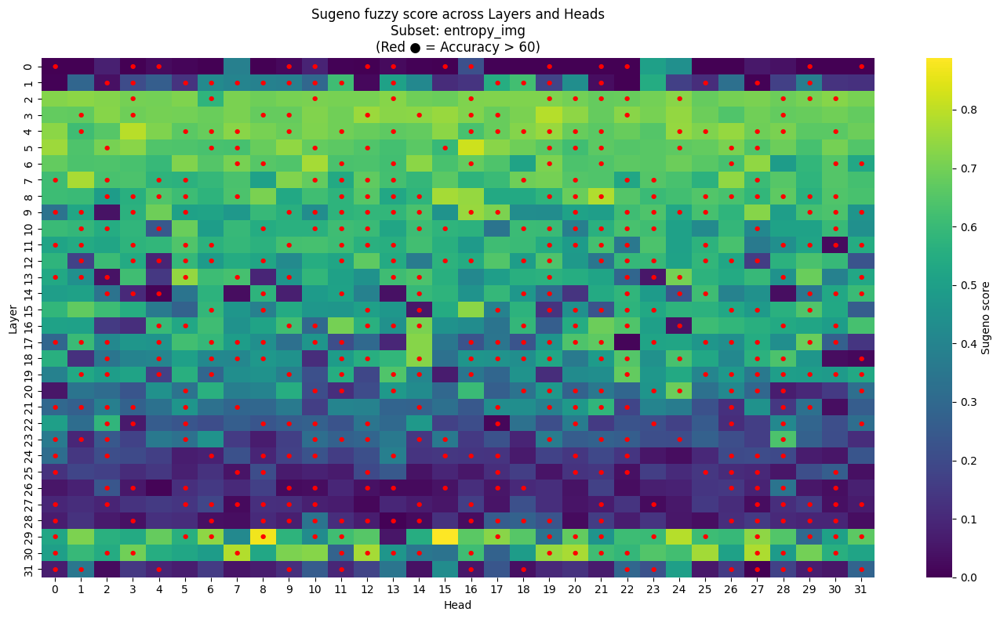

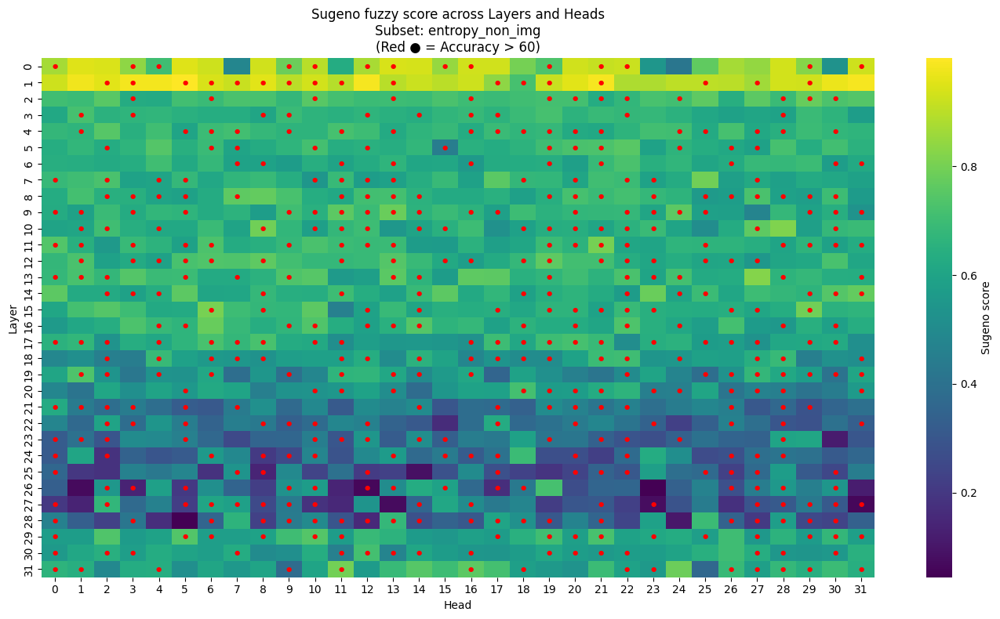

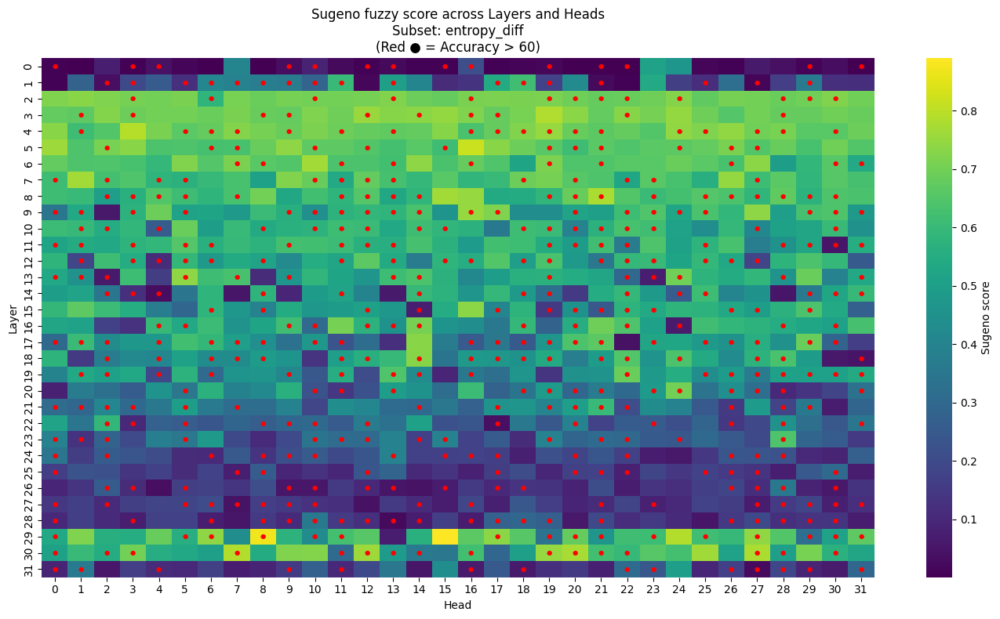

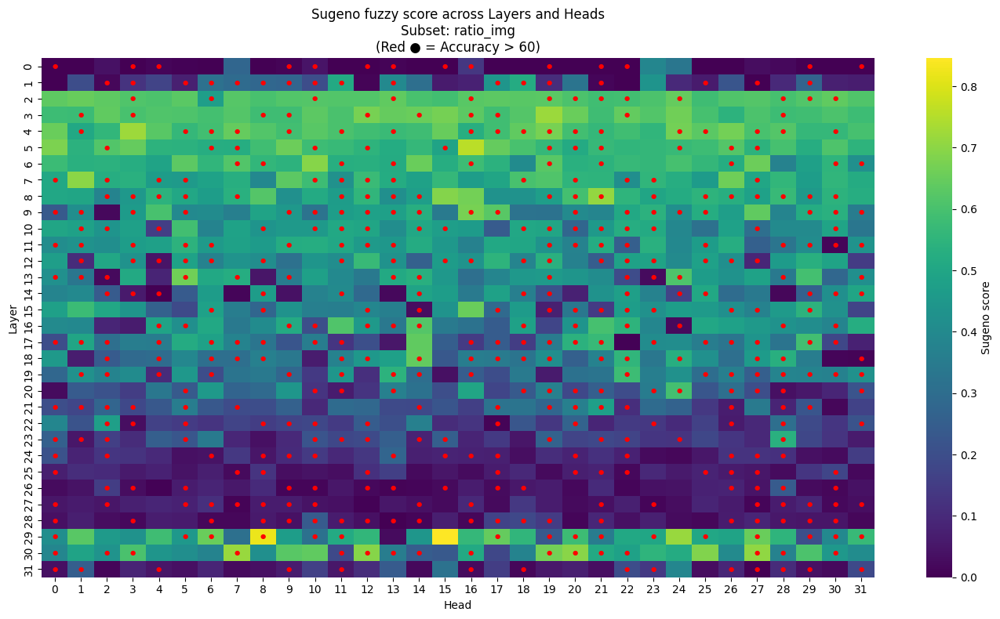

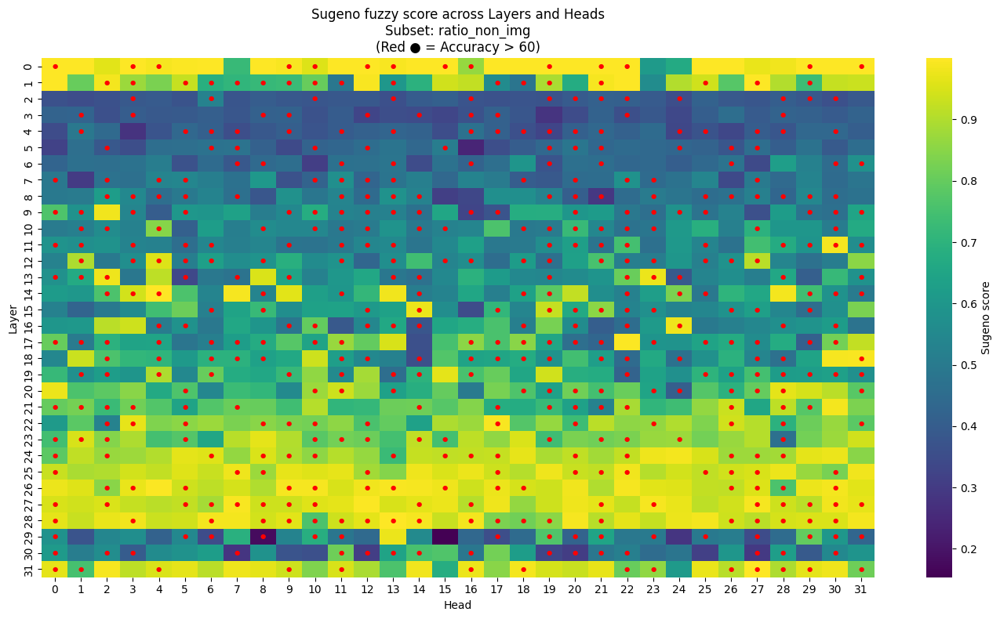

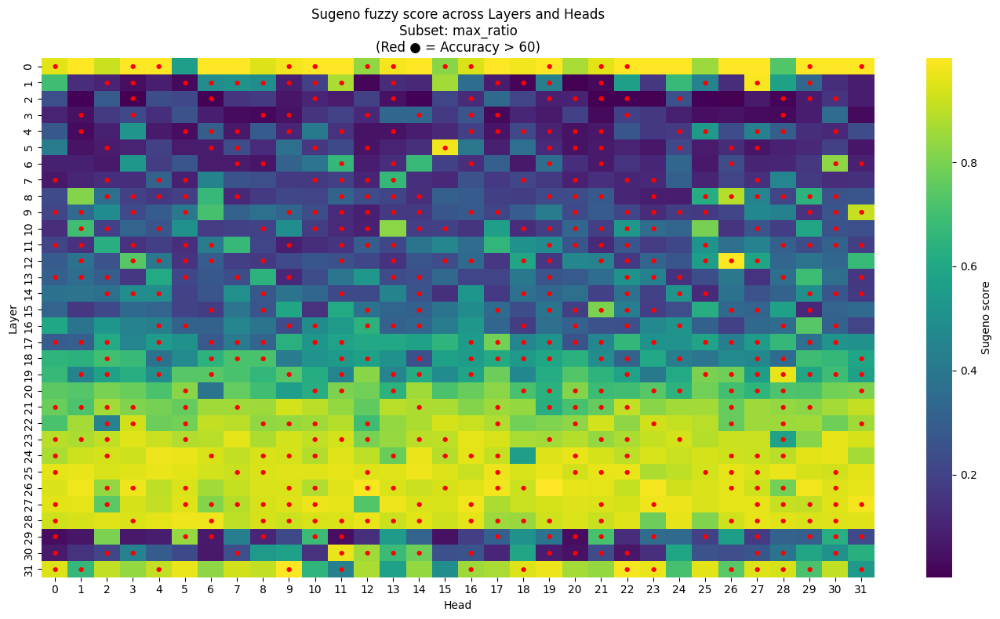

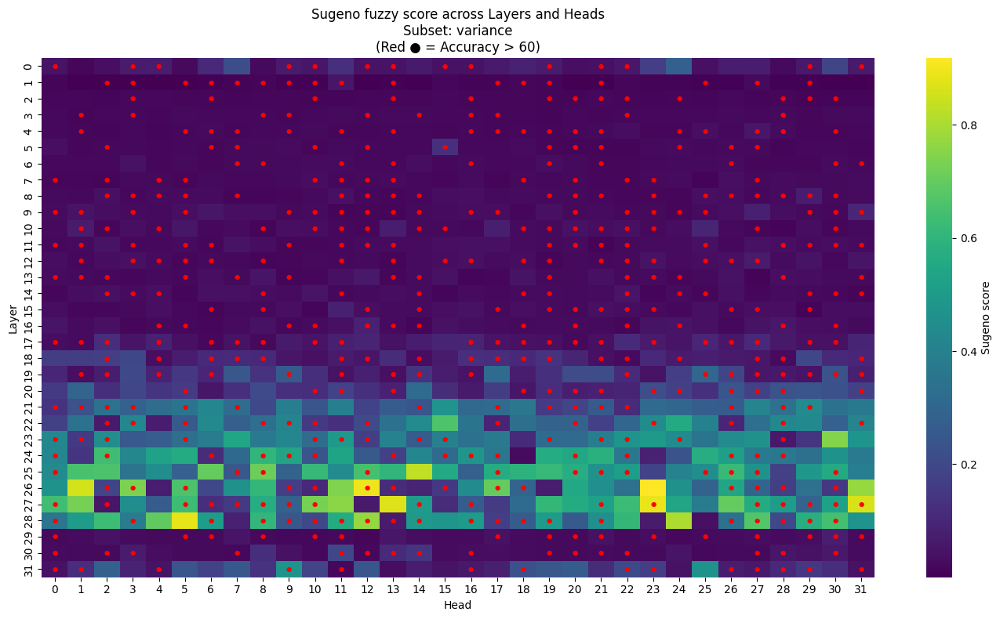

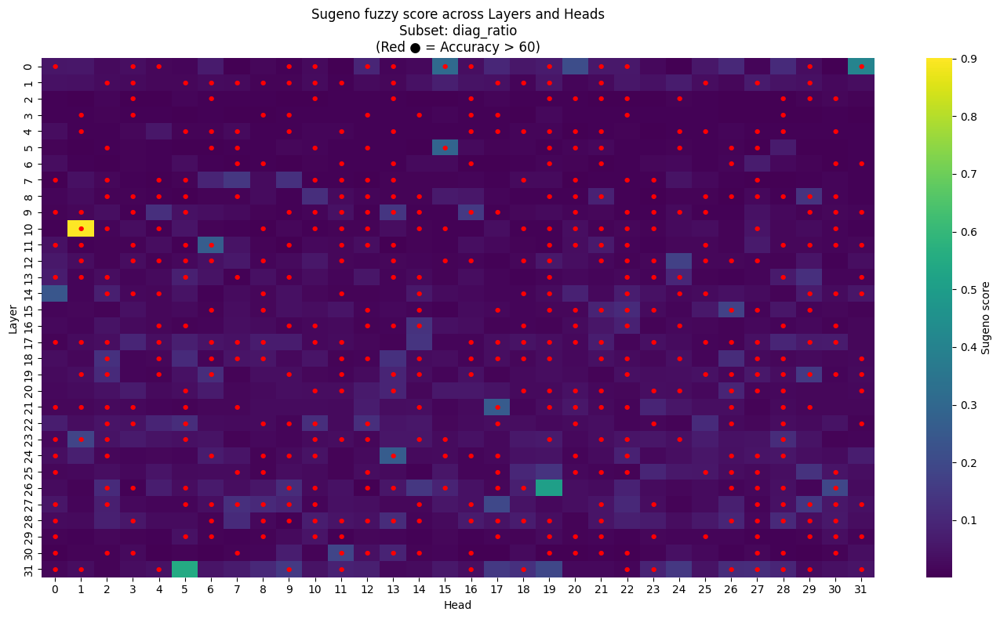

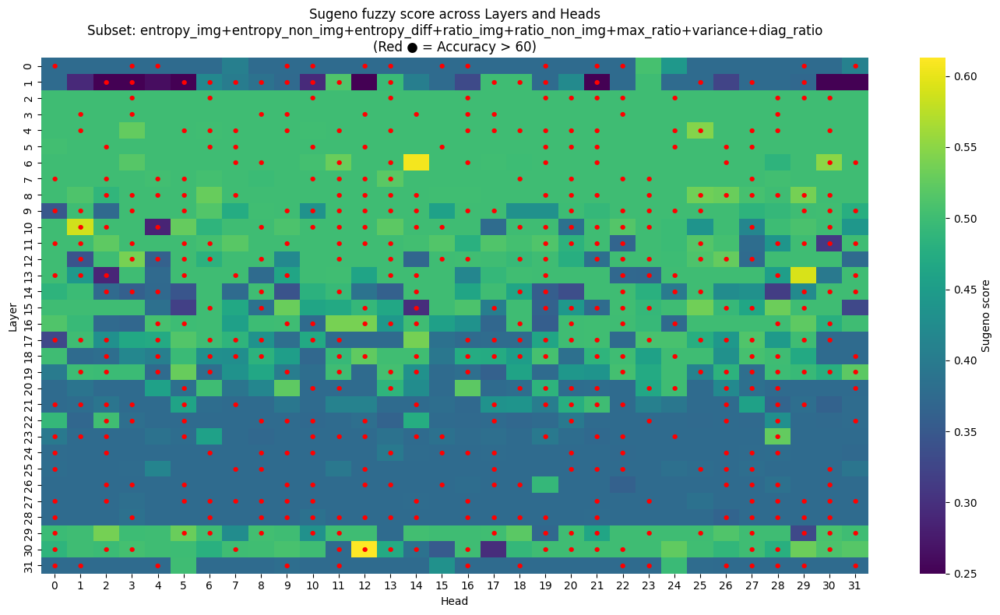

In [98]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ---------------------
# 1. Load metrics JSON
# ---------------------
metrics_file = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5_attention_entropy_head/correct_attention_entropy_all_matrics.json"

records = []
with open(metrics_file, "r", encoding="utf-8") as f:
    for line in f:
        if not line.strip():
            continue
        obj = json.loads(line)
        layer = obj["layer"]
        for h in obj["heads"]:
            rec = {"layer": layer, "head": h["head"]}
            rec.update(h)
            records.append(rec)

df_metrics = pd.DataFrame(records)

# ---------------------
# 2. Sugeno integral
# ---------------------
def sugeno_integral(values: np.ndarray) -> float:
    vals_sorted = np.sort(values)[::-1]  # descending
    n = len(vals_sorted)
    sugeno_vals = []
    for i, v in enumerate(vals_sorted, start=1):
        g_i = i / n
        sugeno_vals.append(min(v, g_i))
    return max(sugeno_vals)

features = ["entropy_img", "entropy_non_img", "entropy_diff",
            "ratio_img", "ratio_non_img", "max_ratio", "variance", "diag_ratio"]

# Normalize features to [0,1]
for f in features:
    min_val, max_val = df_metrics[f].min(), df_metrics[f].max()
    df_metrics[f] = (df_metrics[f] - min_val) / (max_val - min_val + 1e-12)

# ---------------------
# 3. Load ablation accuracy
# ---------------------
results = []
res_path = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5/res.json"
with open(res_path, "r", encoding="utf-8") as f:
    for line in f:
        results.append(json.loads(line))

df_acc = pd.DataFrame(results)
df_acc = df_acc[df_acc["method"] == "scaling_vis"]
df_acc = df_acc[["layer", "head", "Individual accuracy"]]

# ---------------------
# 4. Evaluate single features + all features
# ---------------------
feature_sets = [[f] for f in features] + [features]  # 8개 단일 + 전체

for subset in feature_sets:
    subset_name = "+".join(subset)

    # Compute Sugeno score for this subset
    df_metrics["sugeno_score"] = df_metrics[subset].apply(lambda r: sugeno_integral(r.values), axis=1)

    # Merge with accuracy
    df_merge = df_metrics.groupby(["layer", "head"], as_index=False)["sugeno_score"].mean()
    df_merge = pd.merge(df_merge, df_acc, on=["layer", "head"], how="inner")

    # Mark heads with accuracy > 60
    df_merge["impact_head"] = (df_merge["Individual accuracy"] > 60).astype(int)

    # Pivot for heatmap
    pivot = df_merge.pivot(index="layer", columns="head", values="sugeno_score")

    # Plot heatmap
    plt.figure(figsize=(14, 8))
    sns.heatmap(pivot, cmap="viridis", cbar_kws={'label': 'Sugeno score'})

    # Mark impact heads (accuracy > 60)
    impact_points = df_merge[df_merge["impact_head"] == 1]
    for _, row in impact_points.iterrows():
        plt.text(row["head"] + 0.5, row["layer"] + 0.5, "●",
                 color="red", ha="center", va="center", fontsize=6)

    plt.title(f"Sugeno fuzzy score across Layers and Heads\nSubset: {subset_name}\n(Red ● = Accuracy > 60)")
    plt.xlabel("Head")
    plt.ylabel("Layer")
    plt.tight_layout()
    plt.show()


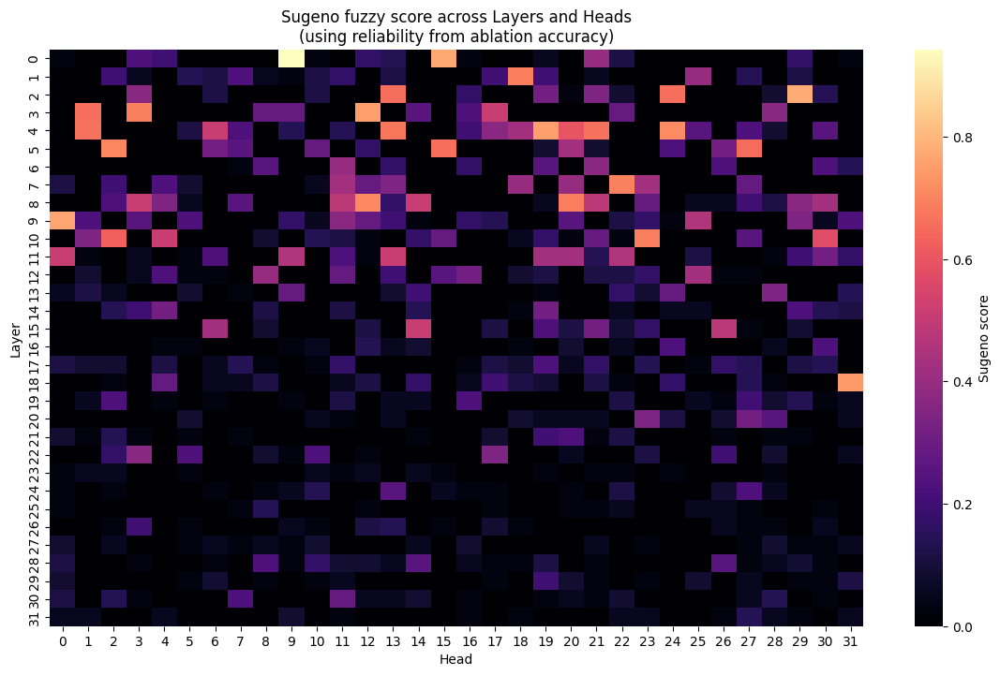

In [99]:
import json
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ---------------------
# 1. Load metrics JSON
# ---------------------
metrics_file = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5_attention_entropy_head/correct_attention_entropy_all_matrics.json"

records = []
with open(metrics_file, "r", encoding="utf-8") as f:
    for line in f:
        if not line.strip():
            continue
        obj = json.loads(line)
        layer = obj["layer"]
        for h in obj["heads"]:
            rec = {"layer": layer, "head": h["head"]}
            rec.update(h)
            records.append(rec)

df_metrics = pd.DataFrame(records)

# ---------------------
# 2. Load ablation accuracy & compute reliability
# ---------------------
res_path = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5/res.json"
results = []
with open(res_path, "r", encoding="utf-8") as f:
    for line in f:
        results.append(json.loads(line))

df_acc = pd.DataFrame(results)
df_acc = df_acc[df_acc["method"] == "scaling_vis"]
df_acc = df_acc[["layer", "head", "Individual accuracy"]].copy()

# reliability = max(0, acc - 60), then normalize to [0,1]
df_acc["reliability"] = np.clip(df_acc["Individual accuracy"] - 60, 0, None)
max_rel = df_acc["reliability"].max()
if max_rel > 0:
    df_acc["reliability"] /= max_rel

# ---------------------
# 3. Merge metrics with reliability
# ---------------------
df = pd.merge(df_metrics, df_acc, on=["layer", "head"], how="inner")

# normalize metrics to [0,1]
features = ["entropy_img", "entropy_non_img", "entropy_diff",
            "ratio_img", "ratio_non_img", "max_ratio", "variance", "diag_ratio"]

for f in features:
    min_val, max_val = df[f].min(), df[f].max()
    df[f] = (df[f] - min_val) / (max_val - min_val + 1e-12)

# ---------------------
# 4. Sugeno integral with reliability
# ---------------------
def sugeno_integral(values: np.ndarray, weights: np.ndarray) -> float:
    """Sugeno integral for one head, given features and reliability weights"""
    # sort by values descending
    order = np.argsort(values)[::-1]
    vals_sorted = values[order]
    w_sorted = weights[order]
    sugeno_vals = [min(vals_sorted[i], w_sorted[i]) for i in range(len(vals_sorted))]
    return max(sugeno_vals)

# compute per (layer, head)
sugeno_scores = []
for (layer, head), grp in df.groupby(["layer", "head"]):
    values = grp[features].mean().values   # average metrics across samples
    rel = np.repeat(grp["reliability"].iloc[0], len(values))  # use same reliability for all features
    score = sugeno_integral(values, rel)
    sugeno_scores.append({"layer": layer, "head": head, "sugeno_score": score})

df_sugeno = pd.DataFrame(sugeno_scores)

# ---------------------
# 5. Heatmap visualization
# ---------------------
pivot = df_sugeno.pivot(index="layer", columns="head", values="sugeno_score")

plt.figure(figsize=(14, 8))
sns.heatmap(pivot, cmap="magma", cbar_kws={'label': 'Sugeno score'})
plt.title("Sugeno fuzzy score across Layers and Heads\n(using reliability from ablation accuracy)")
plt.xlabel("Head")
plt.ylabel("Layer")
plt.show()


In [100]:
import json

# 경로 설정
RES_FILE = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5/res.json"
ACC_MAP_FILE = "/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5/acc_map.json"

acc_map = {}
with open(RES_FILE, "r", encoding="utf-8") as f:
    for line in f:
        if not line.strip():
            continue
        obj = json.loads(line)
        if obj.get("method") == "scaling_vis":  # 필요한 경우만 필터링
            layer = obj["layer"]
            head = obj["head"]
            acc = obj["Individual accuracy"]
            acc_map[(layer, head)] = acc

# 저장 (tuple key는 str로 변환)
acc_map_str = {f"{k[0]}_{k[1]}": v for k, v in acc_map.items()}
with open(ACC_MAP_FILE, "w", encoding="utf-8") as fout:
    json.dump(acc_map_str, fout, ensure_ascii=False, indent=2)

print(f"Saved acc_map with {len(acc_map)} entries → {ACC_MAP_FILE}")


Saved acc_map with 1024 entries → /data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5/acc_map.json


In [1]:
import json, torch
import pandas as pd
import numpy as np

# 1) load
results = []
with open('/data3/KJE/code/WIL_DeepLearningProject_2/VLM_Hallu/output/llava1.5/res.json', 'r', encoding='utf-8') as f:
    for line in f:
        results.append(json.loads(line))
df = pd.DataFrame(results)
df = df[df["method"] == "scaling_vis"]

# 2) layer x head pivot of accuracy
pivot = df.pivot(index="layer", columns="head", values="Individual accuracy").sort_index(axis=0).sort_index(axis=1)

# 3) bad prior strength from accuracy
# rule: accuracy >= 60 → hallucination head
acc = torch.tensor(pivot.values, dtype=torch.float32)           # shape (L,H)
bad_mask = (acc >= 60.0).float()                                # 1 for bad
bad_strength = ((acc - 60.0) / 40.0).clamp(0, 1) * bad_mask     # 60..100 → 0..1; <60 → 0

# 4) two tables
pivot_norm = (1.0 - bad_strength).clamp(0, 1)                   # confidence in [0,1]
torch.save({"pivot_norm": pivot_norm, "bad_prior": bad_strength}, "head_priors.pt")
